In [1]:
import numpy as np
import pandas as pd 
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import LearningCurveDisplay, ShuffleSplit

### classifier models
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

### regression models
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso 
from sklearn.linear_model import Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import roc_curve, auc
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from sklearn.preprocessing import OneHotEncoder

# Introduction

The first part of the journey is to choose the dataset we will work on. Indeed, on the contrary of scientific calculus, Machine Learning is an artisanal and involves more practice than theoretical study. Therefore, it seemed to us that instead of focusing on theory first then practicing, it would be wiser to learn through practice by choosing a handful of datasets, tweaking parameters of models and diving into the theory.      
Therefore, it's essential for us to find some good datasets as we will work on the same ones through the whole journey. 

We will consider two types of machine learning problem : 
- Supervised Learning 
- Unsupervised Learning

# I - Supervised Learning

## I.1) Introduction and presentation of supervised learning

Supervised Learning is a type of machine learning problem where the target variable is labelled. This gives rises to two sub-problems : 
- regression problem
- classification problem

In a regression problem, the target variable is a quantity and thus is represented as a number.
Think of a problem where you want to de termine the price of a house. In this context the price is given in € and thus is represented as a number. 

In a classification problem, the target variable is a class meaning that the target variable even encoded as a natural number has a meaning.
Think of a problem where you want to determine if a mushroom is poisonous or not. You have two classes : "poisonous" and "not poisonous" but for a algorithm to understand it, you would encode it in binary as 0 or 1. If you add more classes, you could go further and encode them as 0,1,2,3,...

Take into account that the way you define the type of problem is done by yourself. In the "house price" setting, we could say that in fact we don't care about the real price but only if the price is "cheap" or "expensive". Those concerns are business-driven and thus must be taken into account or your work would be meaningless

Now, once we would have found our datasets, we want to find suitable models and metrics to evaluate them. 
models and metrics will be problem dependent thus regression vs classification. 

For the regression ones, we choose the following models : 
- Linear Regression
- (Ridge) Linear Regression
- (Lasso) Linear Regression
- Decision Trees 
- Random Forest 
- Support Vector Regression (SVR)
- K-Nearest Neighbors (KNN)  
- Random Forest Regressor 
- Gradient Boosting Regressor 

for the classification ones, we choose the following models : 
- Logistic Regression 
- Decision Trees 
- Random Forest 
- Support Vector Classifier (SVC)
- K-Nearest Neighbors (KNN) 
- Naive Bayes 
- Gradient Boosting Machine (GBM) 
- Stochastic Gradient Descent Classifier (SGD)

Now for the metrics, for the regression problems we choose to look at :
- the MAE (Mean Absolute Error) 
- the RMSE (Root Mean Square Error)

## I.2 - Regression Problems

In [2]:
regression_models = {
    "Linear Regression" : LinearRegression(),
    "Ridge Linear Regression" : Ridge(),
    "Lasso Linear Regression" : Lasso(),
    "Decision Tree Regressor" : DecisionTreeRegressor(),
    "KNN Regressor" : KNeighborsRegressor(),
    "Support Vector Regression" : SVR(),
    "Random Forest Regressor" : RandomForestRegressor(),
    "Gradient Boosting Regressor" : GradientBoostingRegressor()
}

### I.2.1) - The first regression dataset : Parkinson Telemonitoring

#### I.2.1.1) A first look at the dataset

The next dataset is from UCL (https://archive.ics.uci.edu/dataset/189/parkinsons+telemonitoring) 

In [3]:
df_parkinson = pd.read_csv("datasets/parkinsons_telemonitoring/parkinsons_updrs.data")

In [4]:
df_parkinson.head(10)

,subject#,age,sex,test_time,motor_UPDRS,total_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,...,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,1,72,0,5.6431,28.199,34.398,0.00662,0.000034,0.00401,0.00317,...,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,1,72,0,12.6660,28.447,34.894,0.00300,0.000017,0.00132,0.00150,...,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,1,72,0,19.6810,28.695,35.389,0.00481,0.000025,0.00205,0.00208,...,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,1,72,0,25.6470,28.905,35.810,0.00528,0.000027,0.00191,0.00264,...,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,1,72,0,33.6420,29.187,36.375,0.00335,0.000020,0.00093,0.00130,...,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361
5,1,72,0,40.6520,29.435,36.870,0.00353,0.000023,0.00119,0.00159,...,0.214,0.01006,0.01337,0.02263,0.03019,0.009438,22.946,0.53949,0.57243,0.19500
6,1,72,0,47.6490,29.682,37.363,0.00422,0.000024,0.00212,0.00221,...,0.445,0.02376,0.02621,0.03488,0.07128,0.013260,22.506,0.49250,0.54779,0.17563
7,1,72,0,54.6400,29.928,37.857,0.00476,0.000025,0.00226,0.00259,...,0.212,0.00979,0.01462,0.01911,0.02937,0.027969,22.929,0.47712,0.54234,0.23844
8,1,72,0,61.6690,30.177,38.353,0.00432,0.000029,0.00156,0.00207,...,0.371,0.01774,0.02134,0.03451,0.05323,0.013381,22.078,0.51563,0.61864,0.20037
9,1,72,0,68.6880,30.424,38.849,0.00496,0.000027,0.00258,0.00253,...,0.310,0.02030,0.01970,0.02569,0.06089,0.018021,22.606,0.50032,0.58673,0.20117


In [5]:
print(f"The dataset has : \n -{df_parkinson.shape[0]} rows \n -{df_parkinson.shape[1]} columns")

The dataset has : 
 -5875 rows 
 -22 columns


In [6]:
print("The columns are the following : ")
print(df_parkinson.columns.tolist())

The columns are the following : 
['subject#', 'age', 'sex', 'test_time', 'motor_UPDRS', 'total_UPDRS', 'Jitter(%)', 'Jitter(Abs)', 'Jitter:RAP', 'Jitter:PPQ5', 'Jitter:DDP', 'Shimmer', 'Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5', 'Shimmer:APQ11', 'Shimmer:DDA', 'NHR', 'HNR', 'RPDE', 'DFA', 'PPE']


The dataset has a bit more data than the last one. Indeed, we have roughly 6 thousands rows for 22 features.
Same as before, we will have at best 21 predictors and 1 target variable. 
Now let's take a look at the missing values.

Another interesting thing is that in fact we won't use the feature "subject#" as it's not relevant to the problem and our target variables are : 
- motor_UPDRS
- total_UPDRS

#### I.2.1.2) Missing values ?

In [7]:
(df_parkinson.isna().sum(axis = 0)/df_parkinson.shape[0] * 100).sort_values(ascending = False)

subject#         0.0
age              0.0
DFA              0.0
RPDE             0.0
HNR              0.0
NHR              0.0
Shimmer:DDA      0.0
Shimmer:APQ11    0.0
Shimmer:APQ5     0.0
Shimmer:APQ3     0.0
Shimmer(dB)      0.0
Shimmer          0.0
Jitter:DDP       0.0
Jitter:PPQ5      0.0
Jitter:RAP       0.0
Jitter(Abs)      0.0
Jitter(%)        0.0
total_UPDRS      0.0
motor_UPDRS      0.0
test_time        0.0
sex              0.0
PPE              0.0
dtype: float64

Pretty surprising, there is no missing value in this dataset. It's a good point as we won't have to clean it at least on this aspect. 

#### I.2.1.3) The different datatypes : predictors and target variable

In [8]:
df_parkinson.dtypes.value_counts()

float64    19
int64       3
Name: count, dtype: int64

In [9]:
for col in df_parkinson.select_dtypes('float'):
    print(col)

test_time
motor_UPDRS
total_UPDRS
Jitter(%)
Jitter(Abs)
Jitter:RAP
Jitter:PPQ5
Jitter:DDP
Shimmer
Shimmer(dB)
Shimmer:APQ3
Shimmer:APQ5
Shimmer:APQ11
Shimmer:DDA
NHR
HNR
RPDE
DFA
PPE


In [10]:
for col in df_parkinson.select_dtypes('int'):
    print(col)

subject#
age
sex


Every column represents a scalar thus there is no issue with encoding etc. we will just start by dropping the "subject#" column. 

In [11]:
df_parkinson.drop(["subject#"], axis = 1, inplace = True)

In [12]:
col_predictors = [col for col in df_parkinson.columns if (col != "total_UPDRS" and col != "motor_UPDRS")]
col_targets = ["motor_UPDRS","total_UPDRS"]
X = df_parkinson[col_predictors]
y = df_parkinson[col_targets]

In [13]:
X.head()

,age,sex,test_time,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5.6431,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12.6660,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19.6810,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25.6470,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33.6420,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


In [14]:
y.head()

,motor_UPDRS,total_UPDRS
0,28.199,34.398
1,28.447,34.894
2,28.695,35.389
3,28.905,35.810
4,29.187,36.375


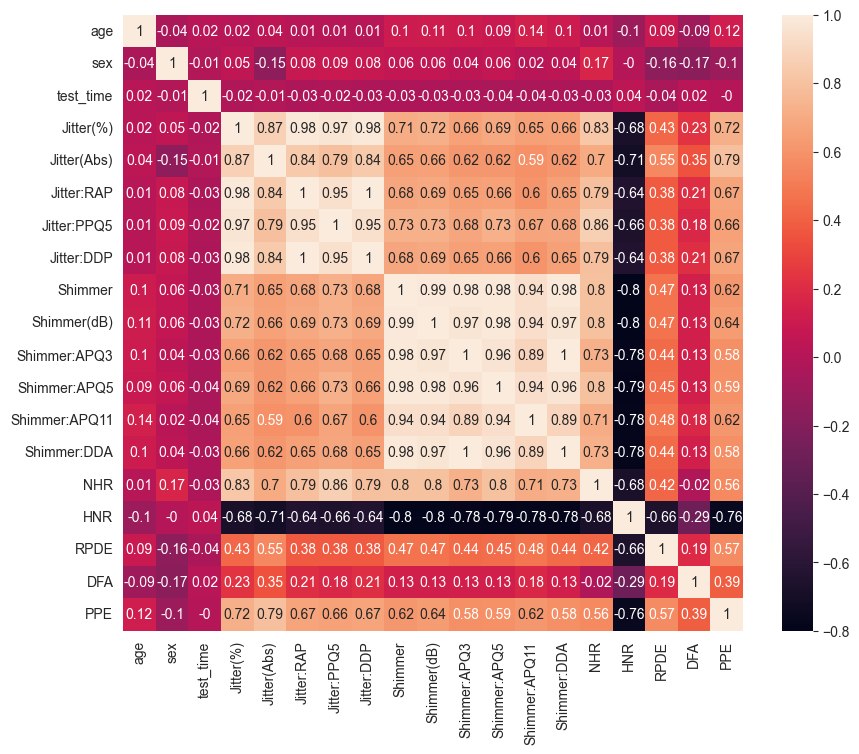

In [15]:
plt.figure(figsize = (10,8))
sns.heatmap(np.round(X.corr(),2), annot=True)
plt.show()

One can remark that many features are correlated. It seems that most of the time they share a common prefix in their name suggesting that they are indeed representing the same thing but in a different ways

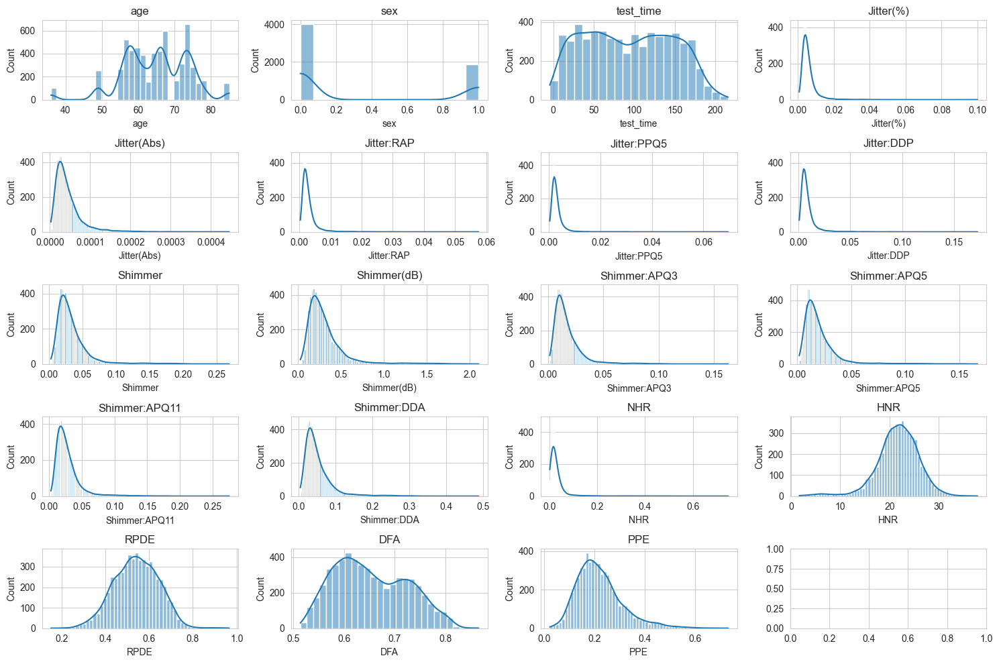

In [16]:
n_rows = 5
n_cols = 4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))

for k, col in enumerate(col_predictors):
    sns.histplot(data=df_parkinson, 
                 x=col, 
                 fill=True,
                 kde=True,
                 alpha=.5,
                 linewidth=1,
                 ax=axes[k // n_cols, k % n_cols])
    axes[k // n_cols, k % n_cols].set_title(col)

plt.tight_layout()
plt.show()

Most of the feature seems to be normal and uni modal or multimodal and many seems to have a pretty big right tail 

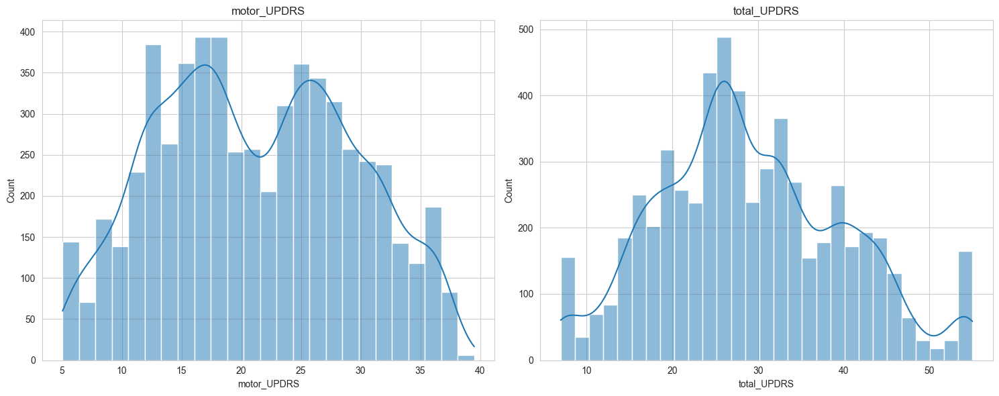

In [17]:
n_rows = 1
n_cols = 2
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 6))

for k, col in enumerate(col_targets):
    sns.histplot(data=df_parkinson, 
                 x=col, 
                 fill=True,
                 kde=True,
                 alpha=.5,
                 linewidth=1,
                 ax=axes[k])
    axes[k].set_title(col)

plt.tight_layout()
plt.show()

#### I.2.1.5) Trying models on the dataframe

Here as we wish to predict a continuous value (or two depending on the target variable we choose at the end) it's a regression problem. Therefore we will select a few machine learning regression models to see how they work on the dataset.

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X.values, y["total_UPDRS"].values)

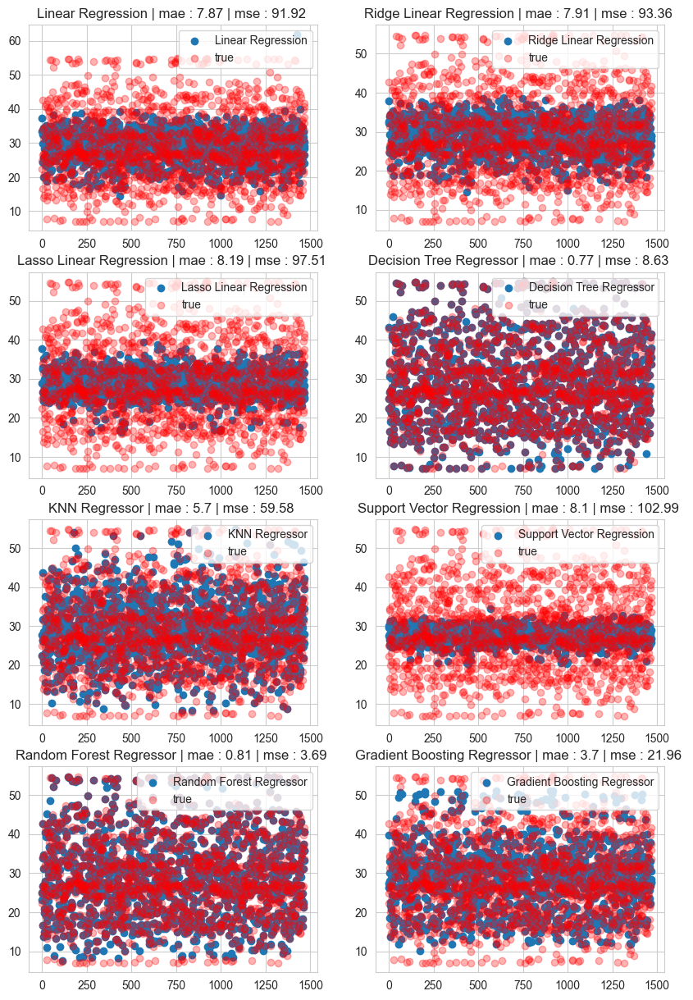

In [19]:
n_rows = 4
n_cols = 2
dic_score = {}
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(10, 15))
k = 0

for model_name, model_instance in regression_models.items():
    model = model_instance.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    dic_score[model_name] = {
        "mae": mean_absolute_error(y_test, y_pred),
        "rmse": np.sqrt(mean_squared_error(y_test, y_pred))
    }
    axes[k // n_cols, k % n_cols].scatter(
        range(len(y_test)),
        y_pred,
        label=model_name)
    axes[k // n_cols, k % n_cols].set_title(f"{model_name} | mae : {round(mean_absolute_error(y_test, y_pred), 2)} | mse : {round(mean_squared_error(y_test, y_pred), 2)} ")
    axes[k // n_cols, k % n_cols].scatter(range(len(y_test)), y_test, color="red", label="true", alpha = 0.3)
    axes[k // n_cols, k % n_cols].legend()
    k += 1
    
plt.show()

df_score = pd.DataFrame(dic_score).T

In [20]:
df_score

,mae,rmse
Linear Regression,7.870014,9.587745
Ridge Linear Regression,7.908896,9.662433
Lasso Linear Regression,8.189277,9.874756
Decision Tree Regressor,0.768171,2.937692
KNN Regressor,5.698249,7.719024
Support Vector Regression,8.096796,10.148572
Random Forest Regressor,0.811473,1.919990
Gradient Boosting Regressor,3.695063,4.685793


#### I.2.1.6) Conclusion 

It seems that our models behave differently. Therefore, it might be good to keep this dataset to work on it. Something even more interesting is that the Decision Tree and Random Forest seems to work way better than the gradient boosting.

### I.2.2) - The second regression dataset : Housing Prices Advanced Regression Techniques

#### I.2.2.1) A first look at the dataset

The following dataset has been found on kaggle : 

In [21]:
df_adv_housing = pd.read_csv("datasets/house-prices-advanced-regression-techniques/train.csv")

In [22]:
df_adv_housing.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2008,WD,Normal,118000


In [23]:
print(f"The dataset has : \n -{df_adv_housing.shape[0]} rows \n -{df_adv_housing.shape[1]} columns")

The dataset has : 
 -1460 rows 
 -81 columns


In [24]:
print("The columns are the following : ")
print(df_adv_housing.columns.tolist())

The columns are the following : 
['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'S

We can notice that for this dataset, we have a lot of columns. Indeed, so far we have 1,5K rows and 80 columns meaning that the dimension of our space of features is pretty big and we don't have a lot of points to work on it. However we don't know if all features are relevant and if there is any missing values. Let's take a look at it 

#### I.2.2.2) Missing values ?

In [25]:
(df_adv_housing.isna().sum(axis = 0)/df_adv_housing.shape[0] * 100).sort_values(ascending = False)

PoolQC         99.520548
MiscFeature    96.301370
Alley          93.767123
Fence          80.753425
MasVnrType     59.726027
                 ...    
ExterQual       0.000000
Exterior2nd     0.000000
Exterior1st     0.000000
RoofMatl        0.000000
SalePrice       0.000000
Length: 81, dtype: float64

<Axes: >

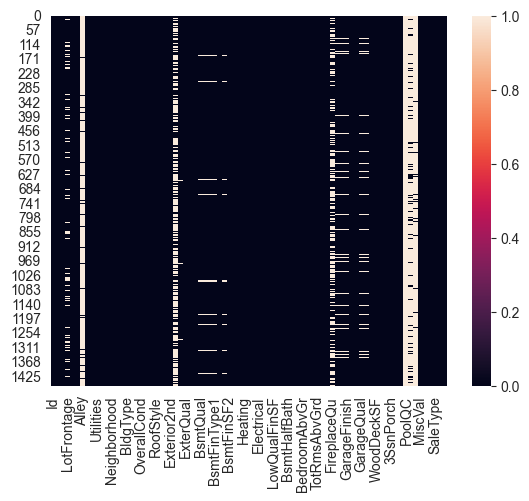

In [26]:
sns.heatmap(df_adv_housing.isna(), cbar = True)

From what we see, it seems that there is a lot of missing values in this dataset. Indeed, some columns have up to 99‰ of missing values making them worthless. The first idea is to drop the columns with at least 30‰ of missing values.   
 We will as well drop the "Id" column as it's useless for machine learning algorithms

In [27]:
col_to_drop = [col_name for col_name in df_adv_housing.isna().sum(axis=0).index.tolist() if (df_adv_housing.isna().sum(axis=0).loc[col_name]/df_adv_housing.shape[0] >= 0.3)] + ["Id"]
print(col_to_drop)

['Alley', 'MasVnrType', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature', 'Id']


In [28]:
print(f"Before dropping some columns : {df_adv_housing.shape[1]} columns")
print(f"After dropping some columns : {df_adv_housing.drop(col_to_drop, axis = 1).shape[1]} columns")

Before dropping some columns : 81 columns
After dropping some columns : 74 columns


In [29]:
df_adv_housing.drop(col_to_drop, axis = 1, inplace = True)

In [30]:
(df_adv_housing.isna().sum(axis =1)/df_adv_housing.shape[1] * 100).sort_values(ascending = False)

39      13.513514
520     13.513514
1179    13.513514
533     13.513514
1011    13.513514
          ...    
554      0.000000
552      0.000000
551      0.000000
550      0.000000
1459     0.000000
Length: 1460, dtype: float64

In [31]:
print(f"before dropping rows : {df_adv_housing.shape[0]}")
print(f"after dropping rows : {df_adv_housing.dropna(axis = 0).shape[0]}")
print(f"The remaining percentage of rows is : {round(df_adv_housing.dropna(axis = 0).shape[0]/df_adv_housing.shape[0],3)}")

before dropping rows : 1460
after dropping rows : 1094
The remaining percentage of rows is : 0.749


So far we have dropped some columns and some rows. Our idea was that some columns where usable due to the large number of missing values and as we don't want to do any preprocessing so far, we as well decided to see the worst case scenario where we would drop as well the rows with missing values

In [32]:
df_adv_housing.dropna(axis = 0, inplace = True)

#### I.2.2.3) The different datatypes : predictors and target variable

In [33]:
df_adv_housing.dtypes.value_counts()

object     37
int64      34
float64     3
Name: count, dtype: int64

In [34]:
continuous_variables = [col for col in df_adv_housing.select_dtypes(["float"])]
discrete_variables = [col for col in df_adv_housing.select_dtypes(["int"])]
categorical_variables = [col for col in df_adv_housing.select_dtypes(["object"])]

In [35]:
print("continuous variables")
print(continuous_variables)
print("----------------------------------------")
print("discrete variables")
print(discrete_variables)
print("----------------------------------------")
print("categorical variables")
print(categorical_variables)

continuous variables
['LotFrontage', 'MasVnrArea', 'GarageYrBlt']
----------------------------------------
discrete variables
['MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
----------------------------------------
categorical variables
['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'Hea

#### I.2.2.4) Relationship between the predictors and the target variable

<Axes: >

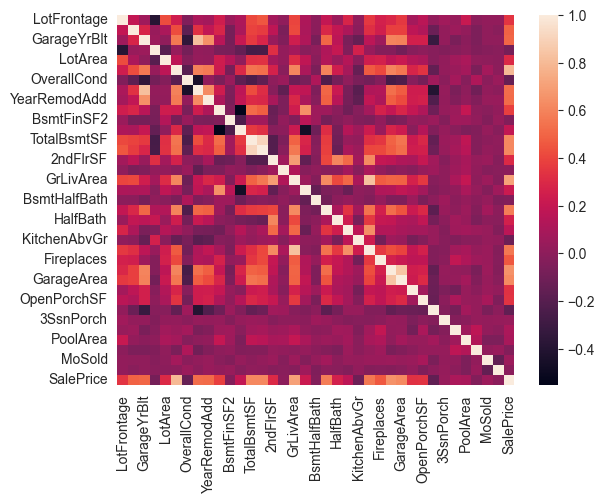

In [36]:
sns.heatmap(df_adv_housing[continuous_variables + discrete_variables].corr())

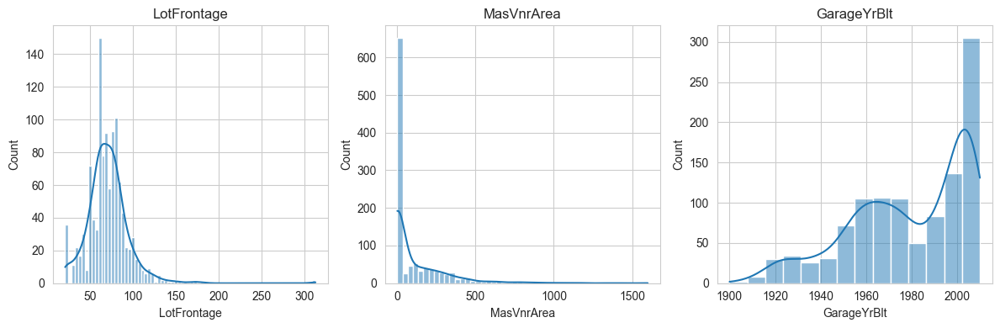

In [37]:
n_row = 1
n_col = 3 
fig, axes = plt.subplots(nrows=n_row, ncols=n_col, figsize=(12, 4))
for k, col in enumerate(continuous_variables):
    sns.histplot(data=df_adv_housing, 
                 x=col, 
                 fill=True,
                 kde=True,
                 alpha=.5,
                 linewidth=1,
                 ax=axes[k])
    axes[k].set_title(col)
    
plt.tight_layout()
plt.show()

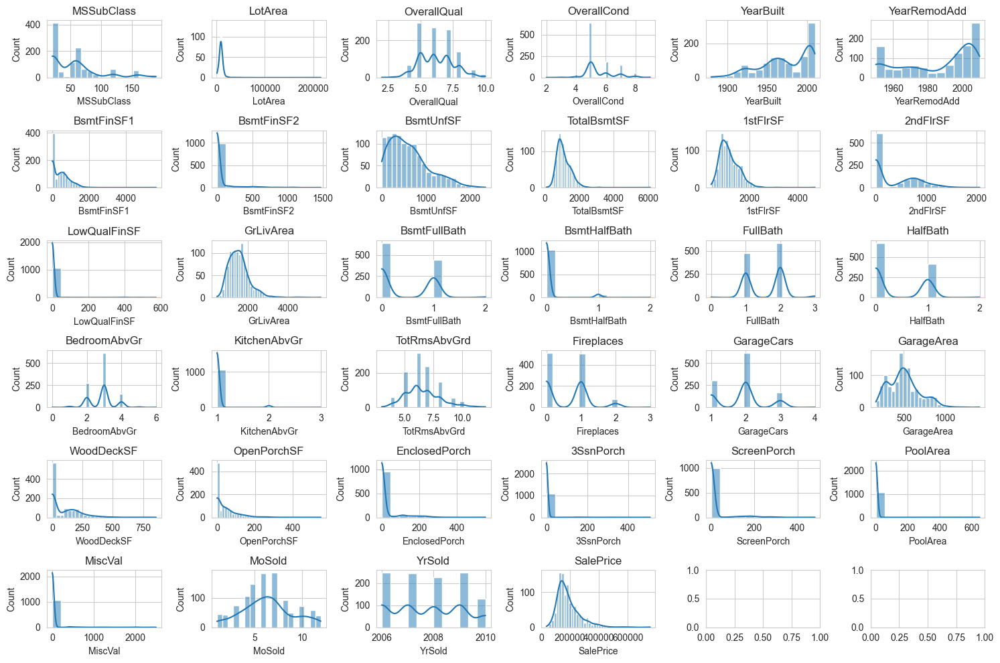

In [38]:
n_rows = 6
n_cols = 6 
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, 10))

for k, col in enumerate(discrete_variables):
    sns.histplot(data=df_adv_housing, 
                 x=col, 
                 fill=True,
                 kde=True,
                 alpha=.5,
                 linewidth=1,
                 ax=axes[k // n_cols, k % n_cols])
    axes[k // n_cols, k % n_cols].set_title(col)

plt.tight_layout()
plt.show()

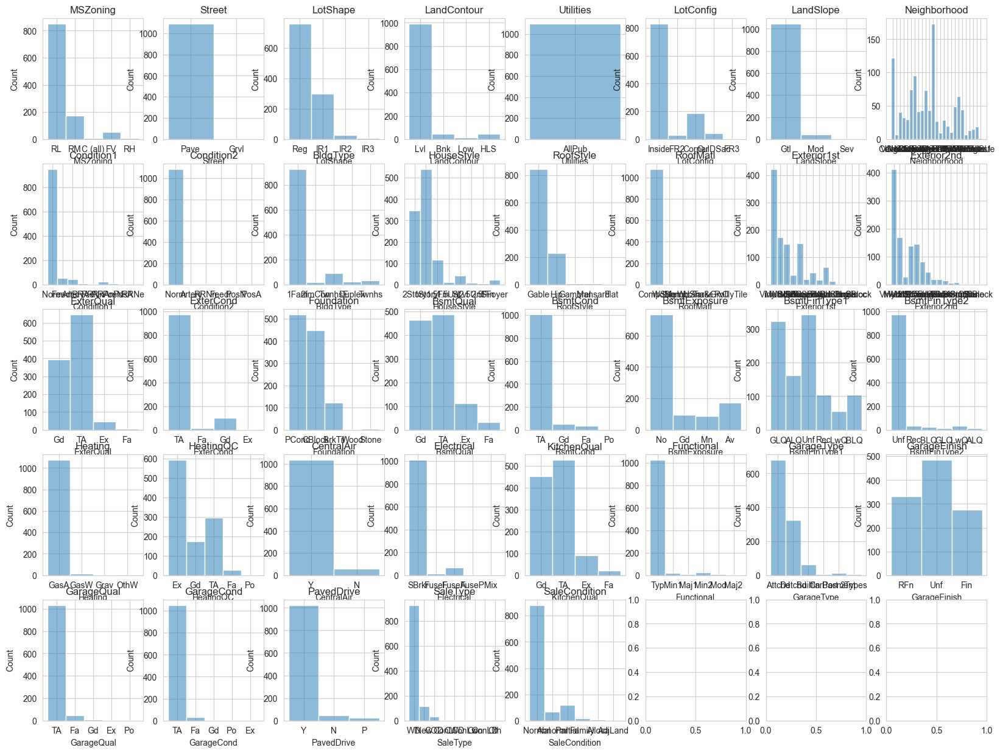

In [39]:
n_rows = 5
n_cols = 8 
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(20, 15))

for k, col in enumerate(categorical_variables):
    sns.histplot(data=df_adv_housing, 
                 x=col, 
                 fill=True,
                 alpha=.5,
                 linewidth=1,
                 ax=axes[k // n_cols, k % n_cols])
    axes[k // n_cols, k % n_cols].set_title(col)

plt.show()

#### I.2.2.5) Trying models on the dataset

For the model initial predicitons, we will use the models we choose earlier. As there is a lot of categorical values, we will deal with it in three parts : 
- first one : we will drop them and evaluate the models on it 
- we will one-hot encode them and evaluate the models on it
- We will try models who can naturally handle categorical values

##### I.2.2.5.1) Trying models and dropping categorical features

In [40]:
df_adv_housing_drop = df_adv_housing.drop(categorical_variables, axis = 1)

In [41]:
X, y = df_adv_housing_drop[[col for col in df_adv_housing_drop.columns.tolist() if col != 'SalePrice']], df_adv_housing_drop['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X.values, y.values)

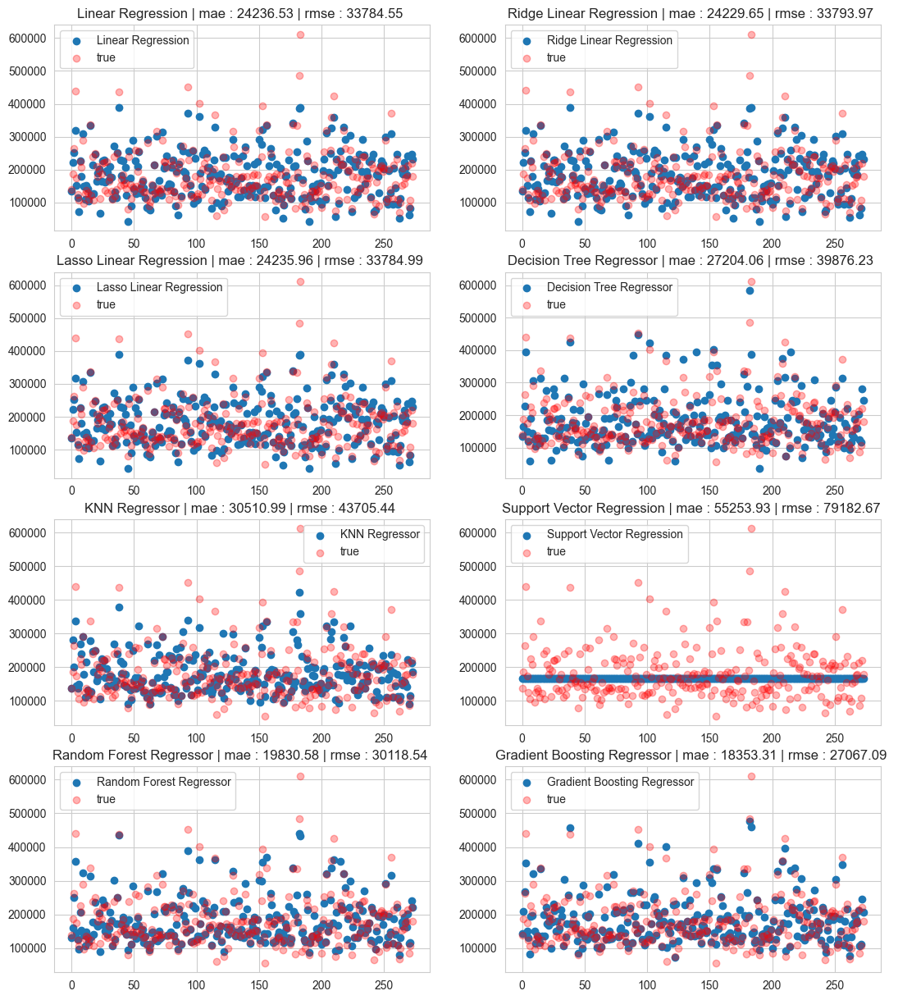

In [42]:
n_rows = 4
n_cols = 2
dic_score = {}
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(13, 15))
k = 0

for model_name, model_instance in regression_models.items():
    model = model_instance.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    dic_score[model_name] = {
        "mae": mean_absolute_error(y_test, y_pred),
        "rmse": np.sqrt(mean_squared_error(y_test, y_pred))
    }
    axes[k // n_cols, k % n_cols].scatter(
        range(len(y_test)),
        y_pred,
        label=model_name)
    axes[k // n_cols, k % n_cols].set_title(f"{model_name} | mae : {round(mean_absolute_error(y_test, y_pred), 2)} | rmse : {round(np.sqrt(mean_squared_error(y_test, y_pred)), 2)} ")
    axes[k // n_cols, k % n_cols].scatter(range(len(y_test)), y_test, color="red", label="true", alpha = 0.3)
    axes[k // n_cols, k % n_cols].legend()
    k += 1
    
plt.show()

df_score_drop = pd.DataFrame(dic_score).T

In [43]:
df_score_drop

,mae,rmse
Linear Regression,24236.525933,33784.551894
Ridge Linear Regression,24229.648557,33793.969627
Lasso Linear Regression,24235.957196,33784.985647
Decision Tree Regressor,27204.058394,39876.227223
KNN Regressor,30510.991971,43705.443723
Support Vector Regression,55253.927150,79182.673331
Random Forest Regressor,19830.579526,30118.537887
Gradient Boosting Regressor,18353.305321,27067.089088


##### I.2.2.5.2) Trying models and using one hot encoding on categorical features

Now we can try a second way using a simple one hot encoding 

In [44]:
df_adv_one_hot = df_adv_housing.copy(deep=True)
categorical_variables = [col for col in df_adv_one_hot.select_dtypes(["object"])]

encoder = OneHotEncoder(sparse_output=False)
one_hot_encoded = encoder.fit_transform(df_adv_one_hot[categorical_variables])

one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_variables))

one_hot_df.reset_index(drop=True, inplace=True)
df_adv_one_hot.reset_index(drop=True, inplace=True)

df_adv_one_hot = pd.concat([df_adv_one_hot, one_hot_df], axis=1)
df_adv_one_hot.drop(categorical_variables, axis=1, inplace=True)

In [45]:
print(f"shape before one hot : {df_adv_housing.shape}")
print(f"shape after one hot : {df_adv_one_hot.shape}")

shape before one hot : (1094, 74)
shape after one hot : (1094, 256)


In [46]:
X, y = df_adv_one_hot[[col for col in df_adv_one_hot.columns.tolist() if col != 'SalePrice']], df_adv_one_hot['SalePrice']
X_train, X_test, y_train, y_test = train_test_split(X.values, y.values)

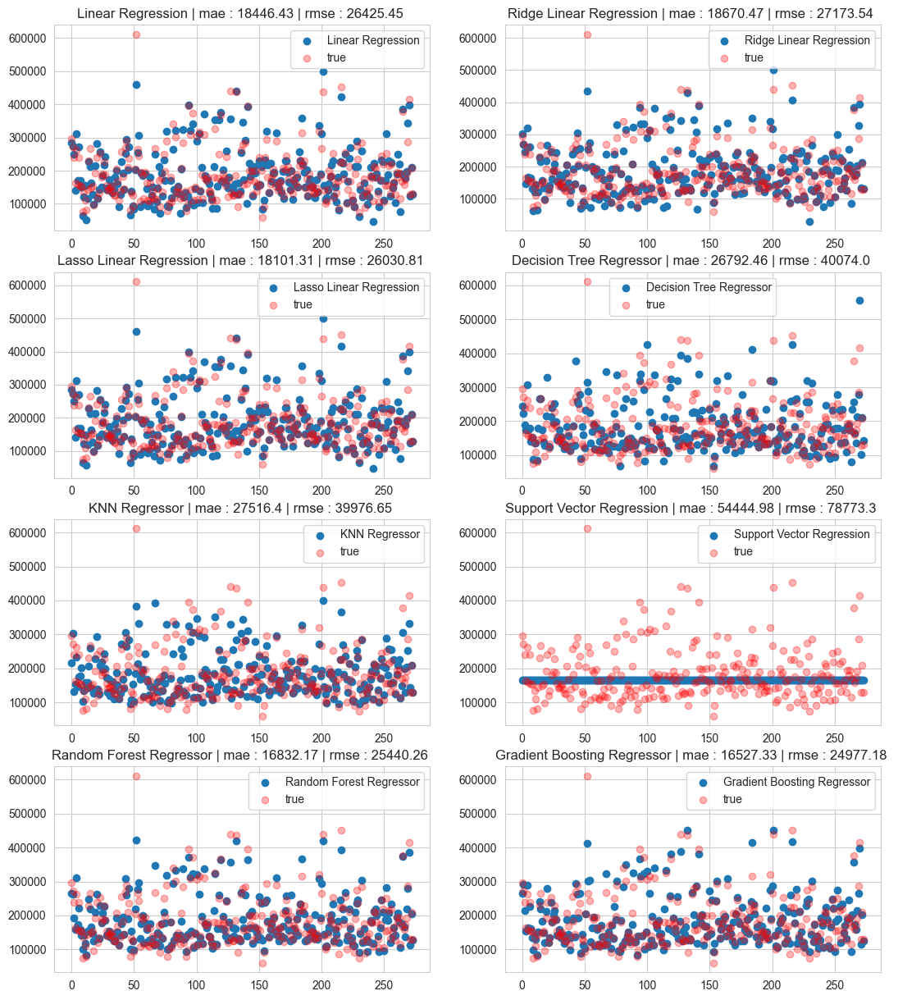

In [47]:
n_rows = 4
n_cols = 2
dic_score = {}
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(13, 15))
k = 0

for model_name, model_instance in regression_models.items():
    model = model_instance.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    dic_score[model_name] = {
        "mae": mean_absolute_error(y_test, y_pred),
        "rmse": np.sqrt(mean_squared_error(y_test, y_pred))
    }
    axes[k // n_cols, k % n_cols].scatter(
        range(len(y_test)),
        y_pred,
        label=model_name)
    axes[k // n_cols, k % n_cols].set_title(f"{model_name} | mae : {round(mean_absolute_error(y_test, y_pred), 2)} | rmse : {round(np.sqrt(mean_squared_error(y_test, y_pred)), 2)} ")
    axes[k // n_cols, k % n_cols].scatter(range(len(y_test)), y_test, color="red", label="true", alpha = 0.3)
    axes[k // n_cols, k % n_cols].legend()
    k += 1
    
plt.show()

df_score_one_hot = pd.DataFrame(dic_score).T

In [48]:
df_score_one_hot

,mae,rmse
Linear Regression,18446.433153,26425.451292
Ridge Linear Regression,18670.474918,27173.542242
Lasso Linear Regression,18101.312609,26030.812571
Decision Tree Regressor,26792.463504,40074.000538
KNN Regressor,27516.400000,39976.654505
Support Vector Regression,54444.978831,78773.298606
Random Forest Regressor,16832.169161,25440.261760
Gradient Boosting Regressor,16527.326264,24977.177482


In [49]:
df_score_all = pd.concat([df_score_drop.add_suffix("_drop"),df_score_one_hot.add_suffix("_one_hot")], axis=1)
prefix_to_order_by = 'mae_'
sorted_columns = sorted(df_score_all.columns, key=lambda x: x if x.startswith(prefix_to_order_by) else '')

df_score_all = df_score_all[sorted_columns]


In [50]:
df_score_all

,rmse_drop,rmse_one_hot,mae_drop,mae_one_hot
Linear Regression,33784.551894,26425.451292,24236.525933,18446.433153
Ridge Linear Regression,33793.969627,27173.542242,24229.648557,18670.474918
Lasso Linear Regression,33784.985647,26030.812571,24235.957196,18101.312609
Decision Tree Regressor,39876.227223,40074.000538,27204.058394,26792.463504
KNN Regressor,43705.443723,39976.654505,30510.991971,27516.400000
Support Vector Regression,79182.673331,78773.298606,55253.927150,54444.978831
Random Forest Regressor,30118.537887,25440.261760,19830.579526,16832.169161
Gradient Boosting Regressor,27067.089088,24977.177482,18353.305321,16527.326264


Even thought we increased the dimension of the space of the features by one hot encoding the categorical features, it seems that this simple trick decreased the error of the models.

#### I.2.2.6) Conclusion

## I.3 - Classification Problems

In [51]:
classifier_models = {
    "Logistic Regression" : LogisticRegression(),
    "Decision Tree" : DecisionTreeClassifier(),
    "Random Forest" : RandomForestClassifier(),
    "Support Vector Classifier" : SVC(),
    "Gaussian Naive Bayes" : GaussianNB(),
    "KNN" : KNeighborsClassifier(),
    "Gradient Boosting Classifier" : GradientBoostingClassifier(),
    "Stochastic Gradient Descent Classifier" : SGDClassifier()
}

In [52]:
def make_roc_fig_classification(dict_models : dict, X : pd.DataFrame, y : pd.DataFrame, name_dataset : str) -> plt.figure:
    X_train, X_test, y_train, y_test = train_test_split(X.values, y.values, random_state=42)

    figure = plt.figure(figsize = (10,5))
    for model_name, model_instance in dict_models.items():
        model = model_instance.fit(X_train, y_train)
        if hasattr(model,"decision_function"):
            y_score = model.decision_function(X_test)
        elif hasattr(model,"predict_proba"):
             y_score = model.predict_proba(X_test)[:,1]
        else:
            print("error")

        fpr, tpr, thresholds = roc_curve(y_test, y_score, pos_label=1)
        roc_auc = auc(fpr, tpr)
        
        plt.plot(
                fpr,
                tpr,
                linestyle = '-',
                label = f"{model_name} | AUC = {round(roc_auc,3)}",
                alpha = 0.8
            )
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("FPR : False Positive Rate ---->")
    plt.ylabel("TPR : True Positive Rate ---->")
    plt.title(f"ROC Curve for different models | {name_dataset} dateset")
    plt.legend()
    
    return figure

In [53]:
def make_roc_fig_classification_v2(dict_models : dict, X : pd.DataFrame, y : pd.DataFrame, name_dataset : str) -> plt.figure:
    """
    This function creates the figure of the roc curve

    Parameters:
    ----------
    dict_models : dict
        Map the name of the model to an instance

    X : pd.DataFrame
        The usual pandas dataframe of features

    y : pd.DataFrame
        The usual pandas dataframe of the target variable

    name_dataset : str
        The name of the dataset

    Returns
    ----------
        plt.figure
        roc curve figure
    """


    X_train, X_temp, y_train, y_temp = train_test_split(X.values, y.values, test_size = 0.3, random_state=42) 
    X_test,X_val,y_test,y_val = train_test_split(X_temp, y_temp, test_size = 0.5, random_state=69)

    figure = plt.figure(figsize = (10,5))
    for model_name, model_instance in dict_models.items():
        model = model_instance.fit(X_train, y_train)

        if hasattr(model,"decision_function"):
            y_score = model.decision_function(X_val)
        elif hasattr(model,"predict_proba"):
             y_score = model.predict_proba(X_val)[:,1]
        else:
            print("error")

        _,_, threshold_array = roc_curve(y_val, y_score)

        #threshold_array = np.linspace(1,0, 20)
        #threshold_array = np.insert(threshold_array, 0, np.inf)

        fpr = []
        tpr = []

        if hasattr(model,"decision_function"):
            predict = model.decision_function(X_test)
        elif hasattr(model,"predict_proba"):
             predict = model.predict_proba(X_test)[:,1]
        else:
            print("error")


        for threshold in threshold_array:
            predicted_proba = np.where(predict >= threshold, 1, 0)
            tp = ((predicted_proba == 1) & (y_test == 1) ).sum()
            fp = ((predicted_proba == 1) & (y_test == 0) ).sum()
            tn = ((predicted_proba == 0) & (y_test == 0) ).sum()
            fn = ((predicted_proba == 0) & (y_test == 1) ).sum()

            if fp+fn == 0:
                fpr.append(0)
            else:
                fpr.append(fp/(fp + tn))
            if tp+fn == 0:
                tpr.append(0)
            else:
                tpr.append(tp/(tp + fn))

        roc_auc = auc(fpr, tpr)

        plt.plot(
                fpr,
                tpr,
                linestyle = '-',
                label = f"{model_name} | AUC = {round(roc_auc,3)}",
                alpha = 0.8
            )

    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel("FPR : False Positive Rate ---->")
    plt.ylabel("TPR : True Positive Rate ---->")
    plt.title(f"ROC Curve for different models | {name_dataset} dateset")
    plt.legend()

In [54]:
def make_learning_curve_fig(dict_models : dict, X : pd.DataFrame, y : pd.DataFrame, name_dataset : str) -> plt.figure:
    common_params = {
        "X" : X.values,
        "y" : y.values,
        "train_sizes": np.linspace(0.1, 1.0, 5),
        "cv": ShuffleSplit(n_splits=10, test_size=0.2, random_state=0),
        "score_type": "both",
        "n_jobs": 4,
        "line_kw": {"marker": "o"},
        "std_display_style": "fill_between",
        "score_name": "Accuracy",
    }

    fig, ax = plt.subplots(nrows=1, ncols=len(classifier_models.keys()), figsize=(22, 4), sharey=True)
    fig.suptitle(f"Learning Curve | {name_dataset} Dataset")
    
    for ax_idx, estimator in enumerate(dict_models.values()):
        LearningCurveDisplay.from_estimator(estimator, **common_params, ax=ax[ax_idx])
        handles, label = ax[ax_idx].get_legend_handles_labels()
        ax[ax_idx].legend(handles[:2], ["Training Score", "Test Score"])
        ax[ax_idx].set_title(f"{estimator.__class__.__name__}")
    
    return fig

### I.3.1) The first dataset : Water Potability

#### I.3.1.1) A first look at the dataset

The first dataset presented is the "Water Potability" one. He has been chosen as he seemed pretty good and as already been chosen by someone. Thus it's more a starting point rather than a true selected one.

In [55]:
df_water = pd.read_csv("datasets/water_potability/water_potability.csv")

In [56]:
df_water.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [57]:
print(f"The dataset has : \n -{df_water.shape[0]} rows \n -{df_water.shape[1]} columns")

The dataset has : 
 -3276 rows 
 -10 columns


In [58]:
print("The columns are the following : ")
print(df_water.columns.tolist())

The columns are the following : 
['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability']


The dataset is rather small as there is 3 thousand rows and 10 columns. However, as we are good to take 9 columns as predictors and 1 as a target variable, the dimension is thus reduced. So far it seems ok. Now let's take a look at the missing values

#### I.2.1.2) Missing values ?

In [59]:
(df_water.isna().sum(axis = 0)/df_water.shape[0] * 100).sort_values(ascending = False)

Sulfate            23.840049
ph                 14.987790
Trihalomethanes     4.945055
Hardness            0.000000
Solids              0.000000
Chloramines         0.000000
Conductivity        0.000000
Organic_carbon      0.000000
Turbidity           0.000000
Potability          0.000000
dtype: float64

It seems that not that many values are missing. Indeed, the missing values are distributed in three columns. Now come the questions of how to handle those missing values. The first idea is to just not caring about the missing values by dropping them. We can either drop them by column or rows. 
There is no need to drop them by columns as they don't represent a big enough part of the total available values of each column. Thus, what we can try to see is what happens if we drop the missing values by rows, e.g : how the size of our sample is reduced by doing so.

In [60]:
print(f"before dropping rows : {df_water.shape[0]}")
print(f"after dropping rows : {df_water.dropna(axis = 0).shape[0]}")
print(f"The remaining percentage of rows is : {round(df_water.dropna(axis = 0).shape[0]/df_water.shape[0],3)}")

before dropping rows : 3276
after dropping rows : 2011
The remaining percentage of rows is : 0.614


It seems that the missing values are distributed in every rows thus our sample has been reduced by 1/3 which is a lot but as we will work with a small number of predictors, we still have a sample of two thousands observations thus it's this ok to work with this dataset.

In [61]:
df_water.dropna(axis = 0, inplace = True)
df_water.reset_index(drop = True, inplace = True)

Not what we dealt with the head of our dataset and the missing value, we can take a deeper look at the dataset 

#### I.2.1.3) The different datatypes : predictors and target variable

In [62]:
df_water.dtypes.value_counts()

float64    9
int64      1
Name: count, dtype: int64

In [63]:
for col in df_water.select_dtypes('float'):
    print(col)

ph
Hardness
Solids
Chloramines
Sulfate
Conductivity
Organic_carbon
Trihalomethanes
Turbidity


In [64]:
for col in df_water.select_dtypes('int'):
    print(col)

Potability


In [65]:
print(df_water.Potability.unique())

[0 1]


Each predictor's value is continuous and the target variable is categorical, it takes its value in $[|0,1|]$. This dataset is thus more suited for classification tasks

#### I.2.1.4) Relationship between the predictors and the target variable

In [66]:
predictors_col = [col for col in df_water.columns if col != "Potability"]
X = df_water[predictors_col]
y = df_water["Potability"]

In [67]:
X.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
1,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
2,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708
3,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989
4,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425


In [68]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Potability, dtype: int64

<Axes: >

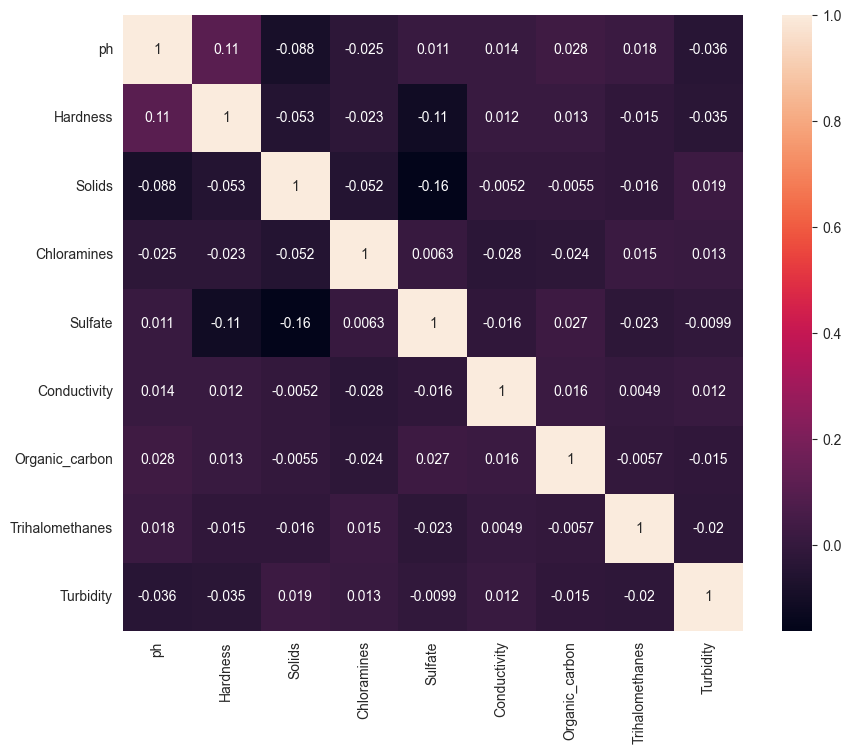

In [69]:
plt.figure(figsize = (10,8))
sns.heatmap(X.corr(), annot=True)

By the look of the heatmap, it seems that no features are highly correlated

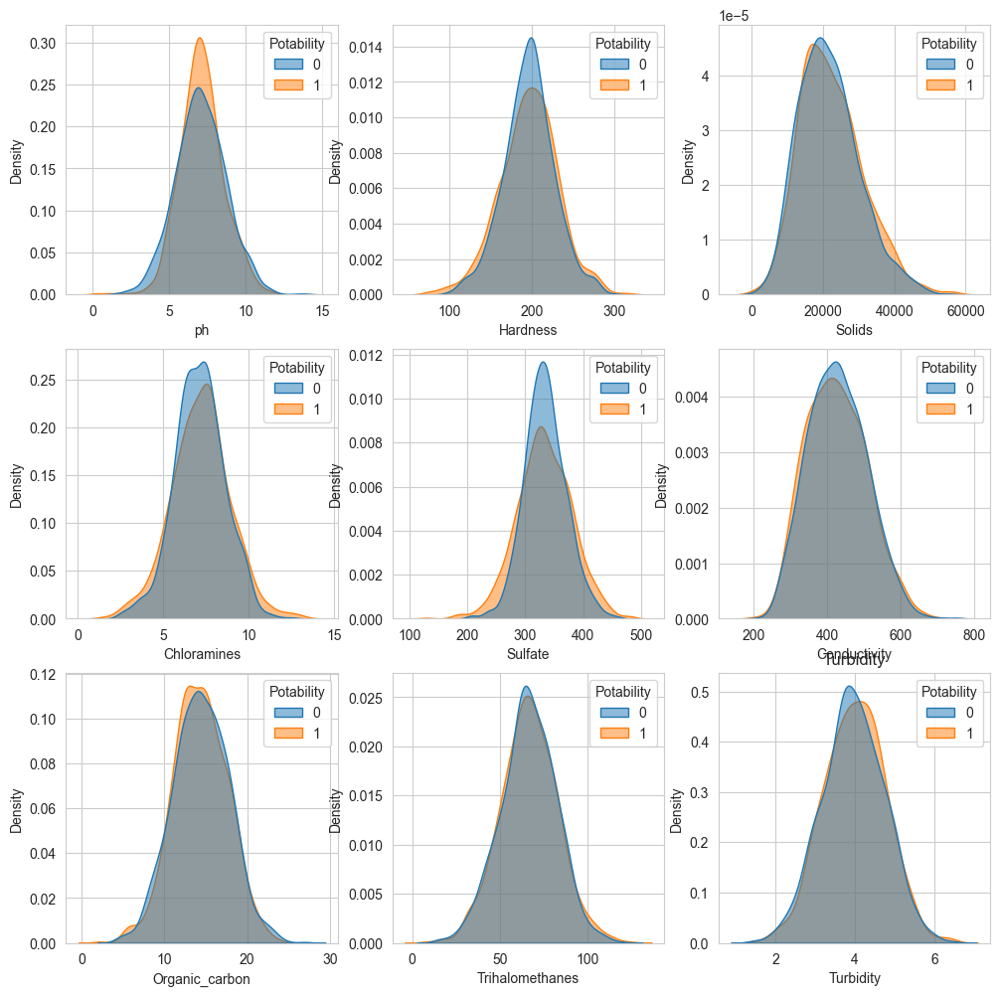

In [70]:
n_rows=3
n_cols=3
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (12,12))
for k,col in enumerate(predictors_col):
    plt.title(col)
    sns.kdeplot(
                data=df_water,
                x=col,
                hue="Potability",
                fill=True, 
                common_norm=False,
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )

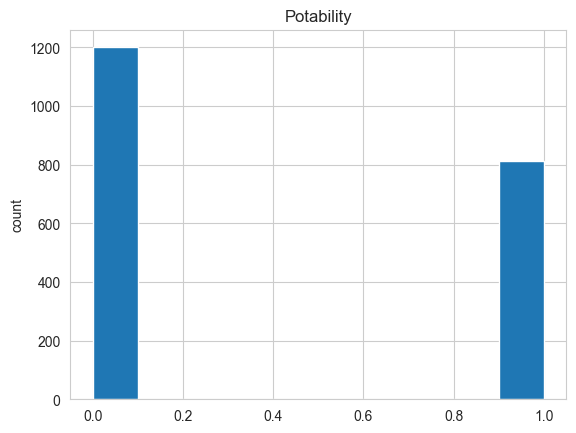

In [71]:
plt.hist(df_water.Potability)
plt.title("Potability")
plt.ylabel("count")
plt.show()

Two interesting elements : 
- It seems that no features gives any idea about the target variable 
- The target variable is kinda unbalanced between both classes but still not that much so no real bias towards one or another 

#### I.2.1.5) Trying models on the dataset

Now that we have a slightly better idea of how is our dataframe, we can try to evaluate the performance of very naïve models on it. The goal of this part is not to find the best models but to see if it's interesting to invest more time on the dataset. Indeed, if all our naïve models without any feature engineering or hyperparameters tuning works perfectly on it, our dataset is way too simple to be worth our time as we won't learn much on it

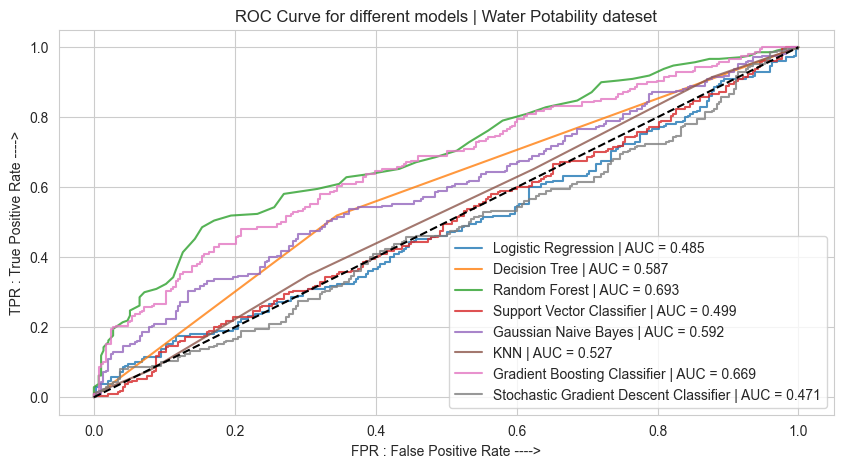

In [72]:
figure_roc_water = make_roc_fig_classification(classifier_models, X,y, "Water Potability")


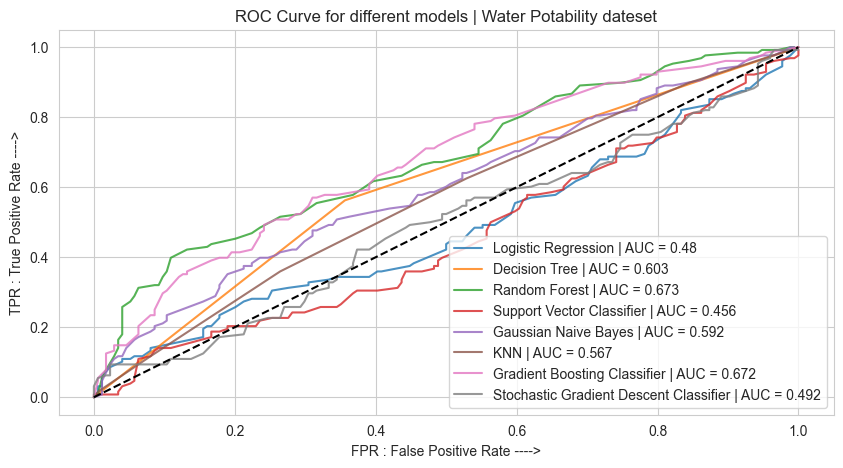

In [73]:
make_roc_fig_classification_v2(classifier_models,X,y, "Water Potability")

It seems that the AUC of each model is between $[ 0.4, 0.7]$ and the fact that the difference is not that huge between each model make it less interesting for us. It seems better to throw it rather than keep it and work on it.

/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

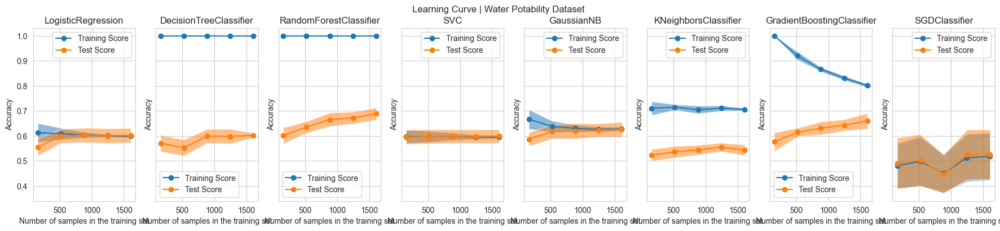

In [74]:
learning_curve_water = make_learning_curve_fig(classifier_models, X,y, "Water Potability")

learning_curve_water.show()

#### I.2.1.6) Conclusion 

### I.3.2 - The second classification dataset : Heart Attach

#### I.3.2.1) A first look at the dataset

This dataset has been found on Kaggle : "https://www.kaggle.com/datasets/rashikrahmanpritom/heart-attack-analysis-prediction-dataset?select=heart.csv"

In [75]:
df_heart = pd.read_csv('datasets/heart_attack/heart.csv')

In [76]:
df_heart.head(10)

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall,output
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


In [77]:
print(f"The dataset has : \n -{df_heart.shape[0]} rows \n -{df_heart.shape[1]} columns")

The dataset has : 
 -303 rows 
 -14 columns


In [78]:
print("The columns are the following : ")
print(df_heart.columns.tolist())

The columns are the following : 
['age', 'sex', 'cp', 'trtbps', 'chol', 'fbs', 'restecg', 'thalachh', 'exng', 'oldpeak', 'slp', 'caa', 'thall', 'output']


The dataset is the smallest we encountered so far. with 300 instances and 14 columns (13 predictors and 1 target variable)

#### I.3.2.2) Missing values ?

In [79]:
(df_heart.isna().sum(axis = 0)/df_heart.shape[0] * 100).sort_values(ascending = False)

age         0.0
sex         0.0
cp          0.0
trtbps      0.0
chol        0.0
fbs         0.0
restecg     0.0
thalachh    0.0
exng        0.0
oldpeak     0.0
slp         0.0
caa         0.0
thall       0.0
output      0.0
dtype: float64

There is no missing value

#### I.3.2.3) The different datatypes : predictors and target variable

In [80]:
df_heart.dtypes.value_counts()

int64      13
float64     1
Name: count, dtype: int64

In [81]:
for col in df_heart.select_dtypes('int'):
    print(col)

age
sex
cp
trtbps
chol
fbs
restecg
thalachh
exng
slp
caa
thall
output


In [82]:
df_heart.sex.unique()

array([1, 0])

In [83]:
for col in df_heart.select_dtypes('float'):
    print(col)

oldpeak


In [84]:
print(df_heart.output.unique())

[1 0]


it seems that the "sex" feature as already been encoded in 0-1 to refers to each sex 

#### I.3.2.4) Relationship between the predictors and the target variable

In [85]:
predictors_col = [col for col in df_heart.columns if col != 'output']
target_variable = 'output'

In [86]:
X = df_heart[predictors_col]
y = df_heart[target_variable]

In [87]:
X.head()

,age,sex,cp,trtbps,chol,fbs,restecg,thalachh,exng,oldpeak,slp,caa,thall
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2


In [88]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: output, dtype: int64

<Axes: >

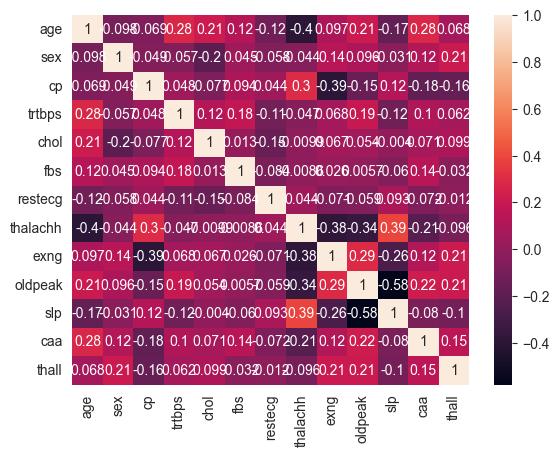

In [89]:
sns.heatmap(X.corr(), annot=True)

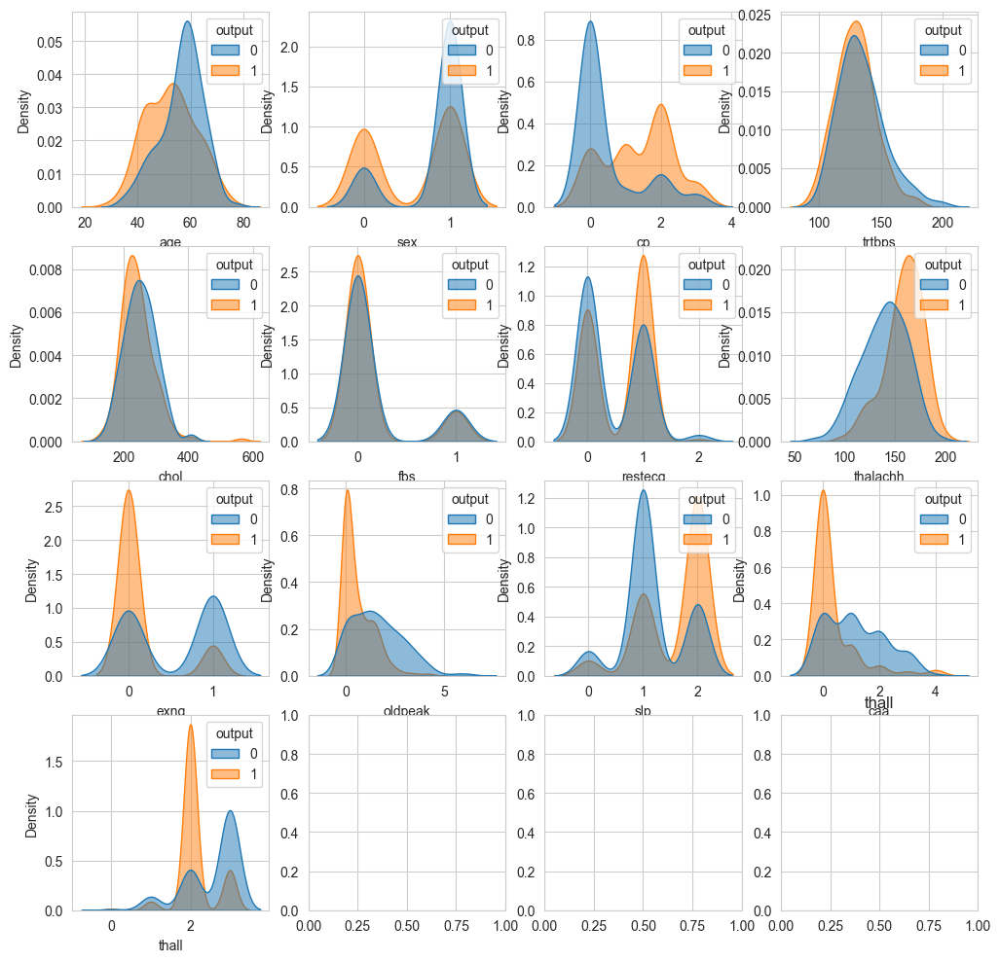

In [90]:
n_rows=4
n_cols=4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (12,12))
for k,col in enumerate(predictors_col):
    plt.title(col)
    sns.kdeplot(
                data=df_heart,
                x=col,
                hue=target_variable,
                fill=True, 
                common_norm=False,
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )

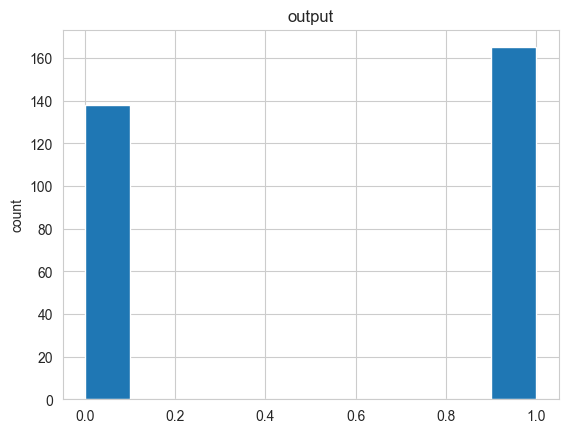

In [91]:
plt.hist(df_heart.output)
plt.title("output")
plt.ylabel("count")
plt.show()

Something interesting we can see is that even thought the classes are pretty balanced, it seems that nearly each predictor has a different distribution with respect to the output values

#### I.3.2.5) Trying models on the dataset

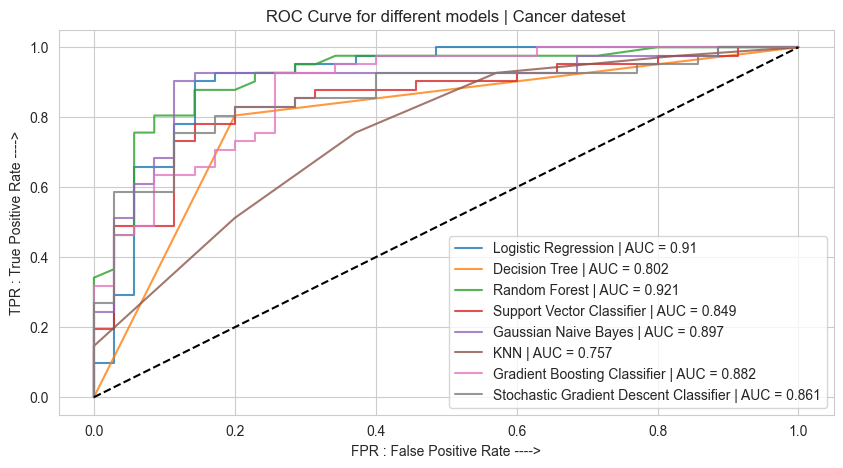

In [92]:
roc_fig_cancer = make_roc_fig_classification(classifier_models, X,y, "Cancer")

roc_fig_cancer.show()

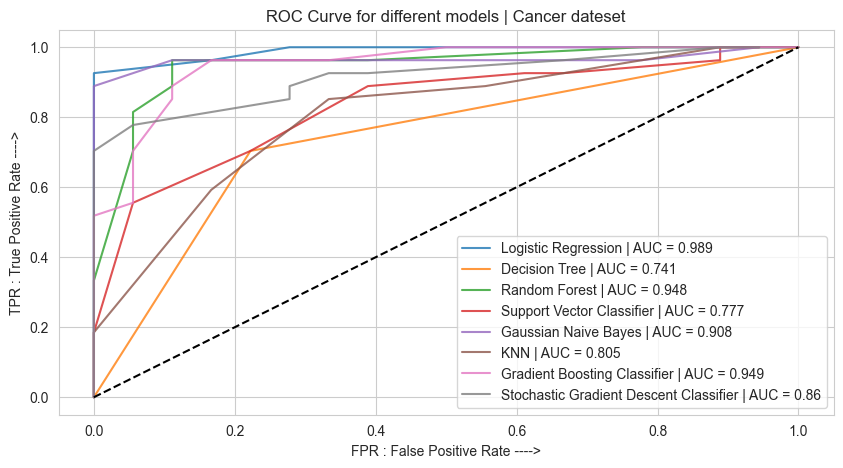

In [93]:
make_roc_fig_classification_v2(classifier_models, X,y, "Cancer")

/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

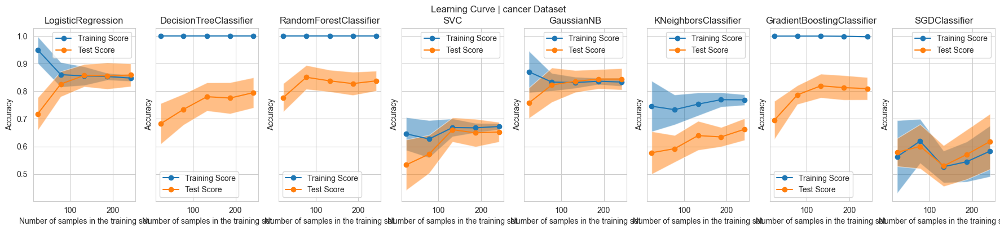

In [94]:
learning_curve_cancer = make_learning_curve_fig(classifier_models,X,y, "cancer")

learning_curve_cancer.show()

Something interesting here is that :
- There is a real difference in performance between each model
- a simple logistic regression is better than every other models which are by far more complex
However every score is pretty high whether no tuning has been done which means that there is not a lot of room for improvement. Therefore, we will drop this dataset

### I.3.3 - The third classification dataset : rain in Australia

#### I.3.3.1) A first look at the dataset

The following dataset has been found on Kaggle : "https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package"

In [95]:
df_rain = pd.read_csv("datasets/rain_in_australia/weatherAUS.csv")

In [96]:
df_rain.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
5,2008-12-06,Albury,14.6,29.7,0.2,NaN,NaN,WNW,56.0,W,...,55.0,23.0,1009.2,1005.4,NaN,NaN,20.6,28.9,No,No
6,2008-12-07,Albury,14.3,25.0,0.0,NaN,NaN,W,50.0,SW,...,49.0,19.0,1009.6,1008.2,1.0,NaN,18.1,24.6,No,No
7,2008-12-08,Albury,7.7,26.7,0.0,NaN,NaN,W,35.0,SSE,...,48.0,19.0,1013.4,1010.1,NaN,NaN,16.3,25.5,No,No
8,2008-12-09,Albury,9.7,31.9,0.0,NaN,NaN,NNW,80.0,SE,...,42.0,9.0,1008.9,1003.6,NaN,NaN,18.3,30.2,No,Yes
9,2008-12-10,Albury,13.1,30.1,1.4,NaN,NaN,W,28.0,S,...,58.0,27.0,1007.0,1005.7,NaN,NaN,20.1,28.2,Yes,No


In [97]:
print(f"The dataset has : \n -{df_rain.shape[0]} rows \n -{df_rain.shape[1]} columns")

The dataset has : 
 -145460 rows 
 -23 columns


In [98]:
print("The columns are the following : ")
print(df_rain.columns.tolist())

The columns are the following : 
['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']


#### I.3.3.2) Missing values ?

In [99]:
(df_rain.isna().sum(axis = 0)/df_rain.shape[0] * 100).sort_values(ascending = False)

Sunshine         48.009762
Evaporation      43.166506
Cloud3pm         40.807095
Cloud9am         38.421559
Pressure9am      10.356799
Pressure3pm      10.331363
WindDir9am        7.263853
WindGustDir       7.098859
WindGustSpeed     7.055548
Humidity3pm       3.098446
WindDir3pm        2.906641
Temp3pm           2.481094
RainTomorrow      2.245978
Rainfall          2.241853
RainToday         2.241853
WindSpeed3pm      2.105046
Humidity9am       1.824557
Temp9am           1.214767
WindSpeed9am      1.214767
MinTemp           1.020899
MaxTemp           0.866905
Location          0.000000
Date              0.000000
dtype: float64

<Axes: >

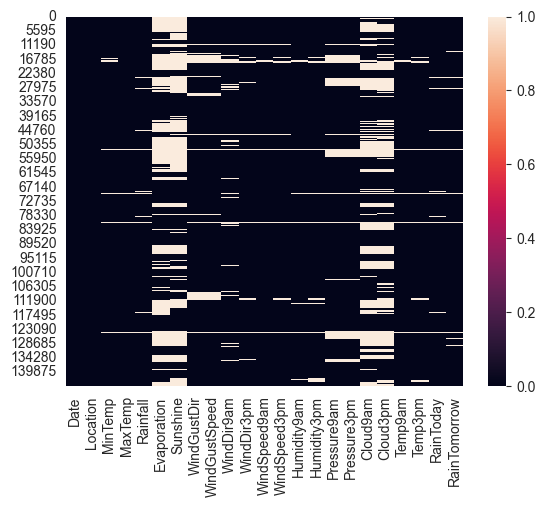

In [100]:
sns.heatmap(df_rain.isna(), cbar = True)

In [101]:
df_rain.dropna(axis = 0, inplace = True)

#### I.3.3.3) The different datatypes : predictors and target variable

In [102]:
df_rain.dtypes.value_counts()

float64    16
object      7
Name: count, dtype: int64

In [103]:
for col in df_rain.select_dtypes('float'):
    print(col)

MinTemp
MaxTemp
Rainfall
Evaporation
Sunshine
WindGustSpeed
WindSpeed9am
WindSpeed3pm
Humidity9am
Humidity3pm
Pressure9am
Pressure3pm
Cloud9am
Cloud3pm
Temp9am
Temp3pm


In [104]:
for col in df_rain.select_dtypes('object'):
    print(col)

Date
Location
WindGustDir
WindDir9am
WindDir3pm
RainToday
RainTomorrow


In [105]:
print(df_rain["Date"].unique())

['2009-01-01' '2009-01-02' '2009-01-04' ... '2016-07-08' '2016-06-04'
 '2016-06-05']


In [106]:
print(df_rain["Location"].unique())

['Cobar' 'CoffsHarbour' 'Moree' 'NorfolkIsland' 'Sydney' 'SydneyAirport'
 'WaggaWagga' 'Williamtown' 'Canberra' 'Sale' 'MelbourneAirport'
 'Melbourne' 'Mildura' 'Portland' 'Watsonia' 'Brisbane' 'Cairns'
 'Townsville' 'MountGambier' 'Nuriootpa' 'Woomera' 'PerthAirport' 'Perth'
 'Hobart' 'AliceSprings' 'Darwin']


In [107]:
print(df_rain["RainToday"].unique())

['No' 'Yes']


In [108]:
print(df_rain["RainTomorrow"].unique())

['No' 'Yes']


In [109]:
print(df_rain["WindDir3pm"].unique())

['SW' 'SSE' 'NNW' 'WSW' 'WNW' 'S' 'ENE' 'N' 'SE' 'NNE' 'NW' 'E' 'ESE' 'NE'
 'SSW' 'W']


First of all we can see that for some categorical features, we will have to map the values from "yes" and "no" to "1" and "0". 

In [110]:
df_rain.replace({'No': 0, 'Yes': 1}, inplace=True)
df_rain = df_rain.astype({"RainTomorrow": 'int64', "RainToday": 'int64'})

In [111]:
df_rain

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,2009-01-01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,...,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,0,0
6050,2009-01-02,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,...,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,0,0
6052,2009-01-04,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,...,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,0,0
6053,2009-01-05,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,...,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,0,0
6054,2009-01-06,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,...,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,2017-06-20,Darwin,19.3,33.4,0.0,6.0,11.0,ENE,35.0,SE,...,63.0,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,0,0
142299,2017-06-21,Darwin,21.2,32.6,0.0,7.6,8.6,E,37.0,SE,...,56.0,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,0,0
142300,2017-06-22,Darwin,20.7,32.8,0.0,5.6,11.0,E,33.0,E,...,46.0,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,0,0
142301,2017-06-23,Darwin,19.5,31.8,0.0,6.2,10.6,ESE,26.0,SE,...,62.0,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,0,0


In [112]:
col_to_drop = [col for col in df_rain.select_dtypes(["object"])]
df_rain.drop(col_to_drop, axis = 1, inplace = True)

#### I.3.3.4) Relationship between the predictors and the target variable

<Axes: >

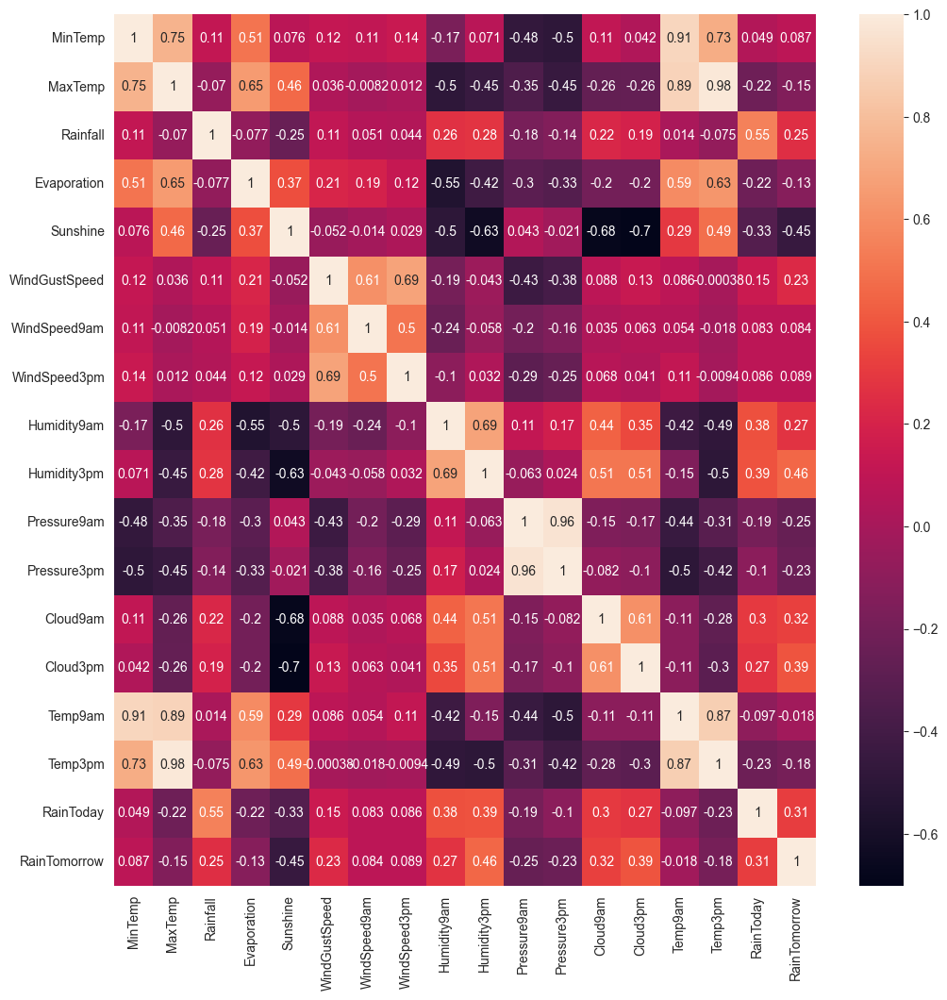

In [113]:
plt.figure(figsize = (12,12))
sns.heatmap(df_rain.corr(), annot = True)

In [114]:
predictors_col = [col for col in df_rain.columns if col != 'RainTomorrow']

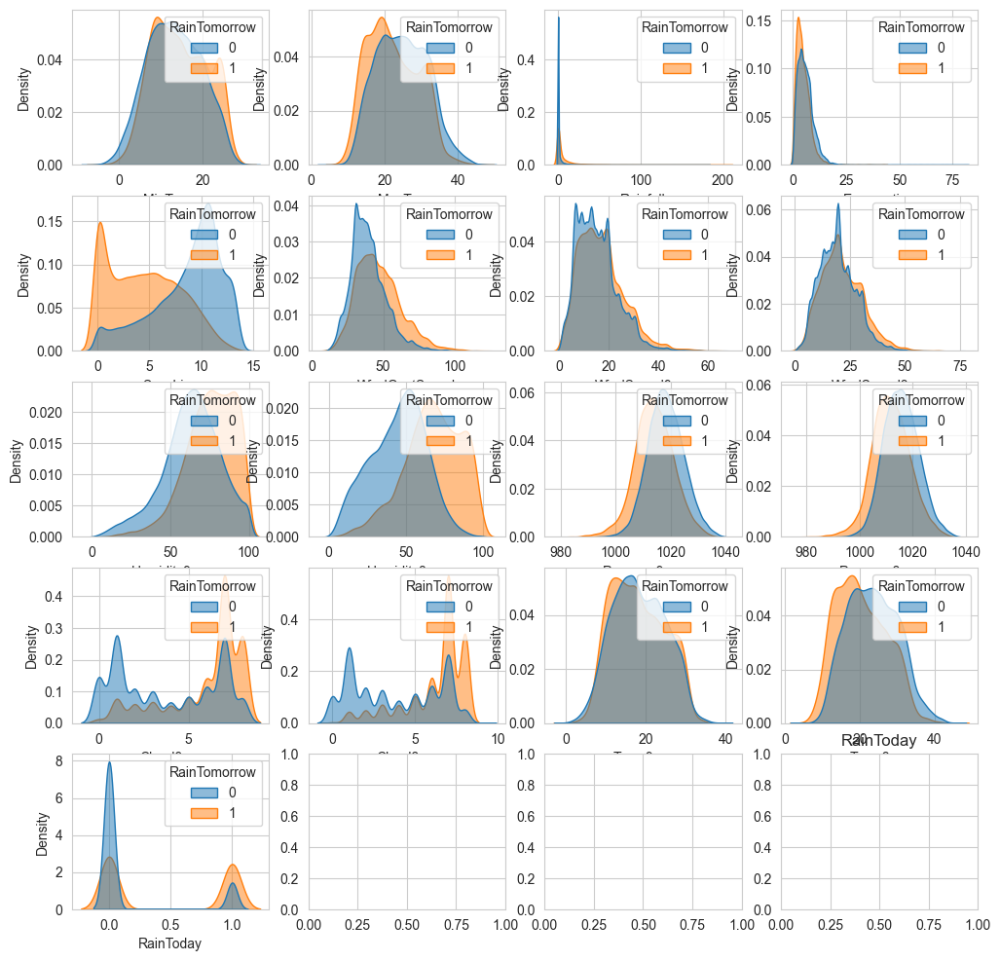

In [115]:
n_rows=5
n_cols=4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (12,12))
for k,col in enumerate(predictors_col):
    plt.title(col)
    sns.kdeplot(
                data=df_rain,
                x=col,
                hue="RainTomorrow",
                fill=True, 
                common_norm=False,
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )
    
plt.show()

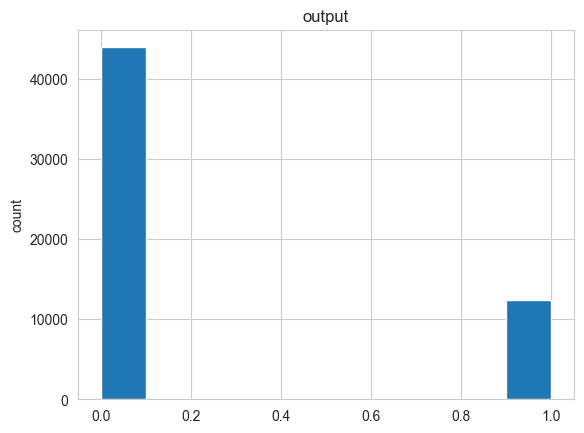

In [116]:
plt.hist(df_rain.RainTomorrow)
plt.title("output")
plt.ylabel("count")
plt.show()

#### I.3.3.5) Trying models on the dataset

In [117]:
X,y = df_rain[predictors_col], df_rain["RainTomorrow"]

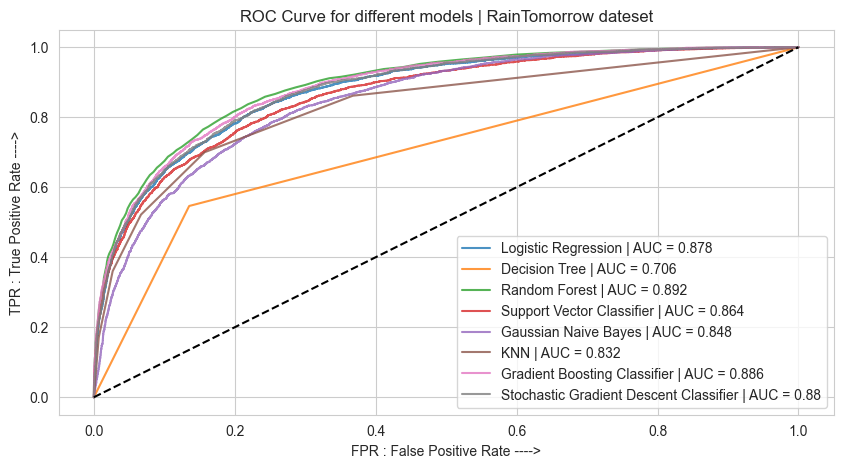

In [118]:
fig_roc_curve_rain = make_roc_fig_classification(classifier_models, X,y, "RainTomorrow")


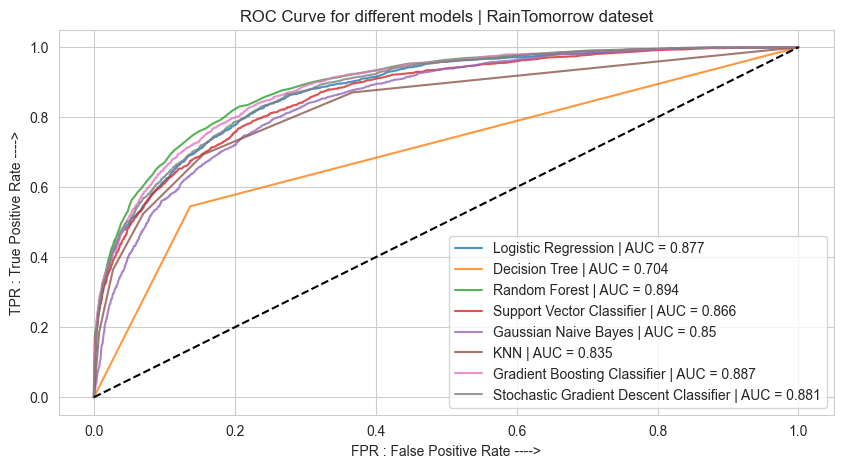

In [119]:
fig_roc_curve_rain_v2 = make_roc_fig_classification_v2(classifier_models, X,y, "RainTomorrow")

Due to too much rows, we won't draw a learning curve for this dataset 

It seems that all models performs very well on this dataset. Which make it relevant to work on 

### I.3.4 - The fourth classification dataset : Mobile Price Classification

#### I.3.4.1) A first look at the dataset

In [120]:
df_mobile = pd.read_csv("datasets/mobile_price_classification/train.csv")

In [121]:
df_mobile.head(10)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,...,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.7,0,4,1,10,0.8,139,8,...,381,1018,3220,13,8,18,1,0,1,3
7,1954,0,0.5,1,0,0,24,0.8,187,4,...,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,...,386,836,1099,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,...,1137,1224,513,19,10,12,1,0,0,0


In [122]:
print(f"The dataset has : \n -{df_mobile.shape[0]} rows \n -{df_mobile.shape[1]} columns")

The dataset has : 
 -2000 rows 
 -21 columns


In [123]:
print(df_mobile.columns.tolist())

['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi', 'price_range']


#### I.3.4.2) Missing values ?

In [124]:
(df_mobile.isna().sum(axis = 0)/df_mobile.shape[0] * 100).sort_values(ascending = False)

battery_power    0.0
px_height        0.0
wifi             0.0
touch_screen     0.0
three_g          0.0
talk_time        0.0
sc_w             0.0
sc_h             0.0
ram              0.0
px_width         0.0
pc               0.0
blue             0.0
n_cores          0.0
mobile_wt        0.0
m_dep            0.0
int_memory       0.0
four_g           0.0
fc               0.0
dual_sim         0.0
clock_speed      0.0
price_range      0.0
dtype: float64

no missing values

#### I.3.4.3) The different datatypes : predictors and target variable

In [125]:
df_mobile.dtypes.value_counts()

int64      19
float64     2
Name: count, dtype: int64

In [126]:
for col in df_mobile.select_dtypes('float'):
    print(col)

clock_speed
m_dep


In [127]:
for col in df_mobile.select_dtypes('int'):
    print(col)

battery_power
blue
dual_sim
fc
four_g
int_memory
mobile_wt
n_cores
pc
px_height
px_width
ram
sc_h
sc_w
talk_time
three_g
touch_screen
wifi
price_range


In [128]:
df_mobile.price_range.unique()

array([1, 2, 3, 0])

#### I.3.4.4) Relationship between the predictors and the target variable

In [129]:
predictors_col = [col for col in df_mobile.columns if col != 'price_range']
target_variable = 'price_range'

In [130]:
X = df_mobile[predictors_col]
y = df_mobile[target_variable]

<Axes: >

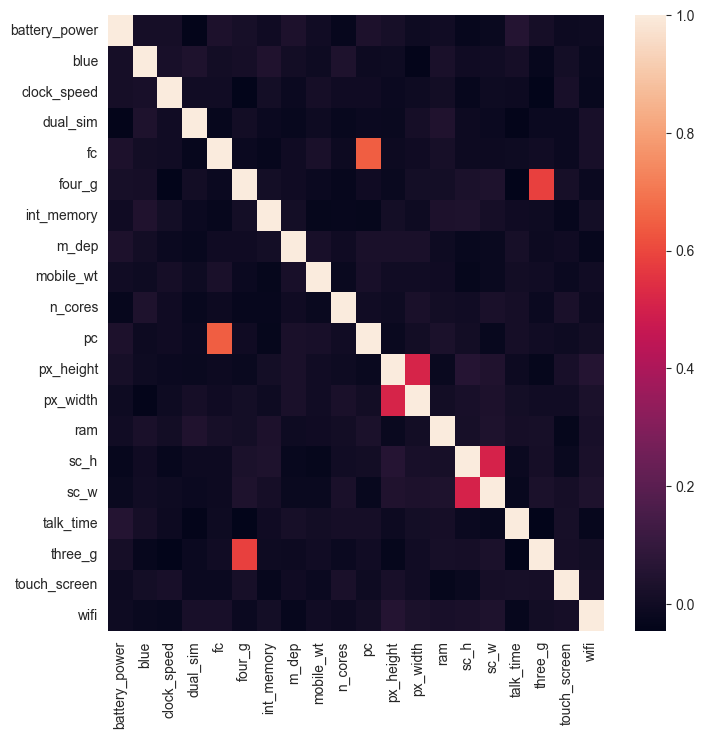

In [131]:
plt.figure(figsize = (8,8))
sns.heatmap(X.corr())

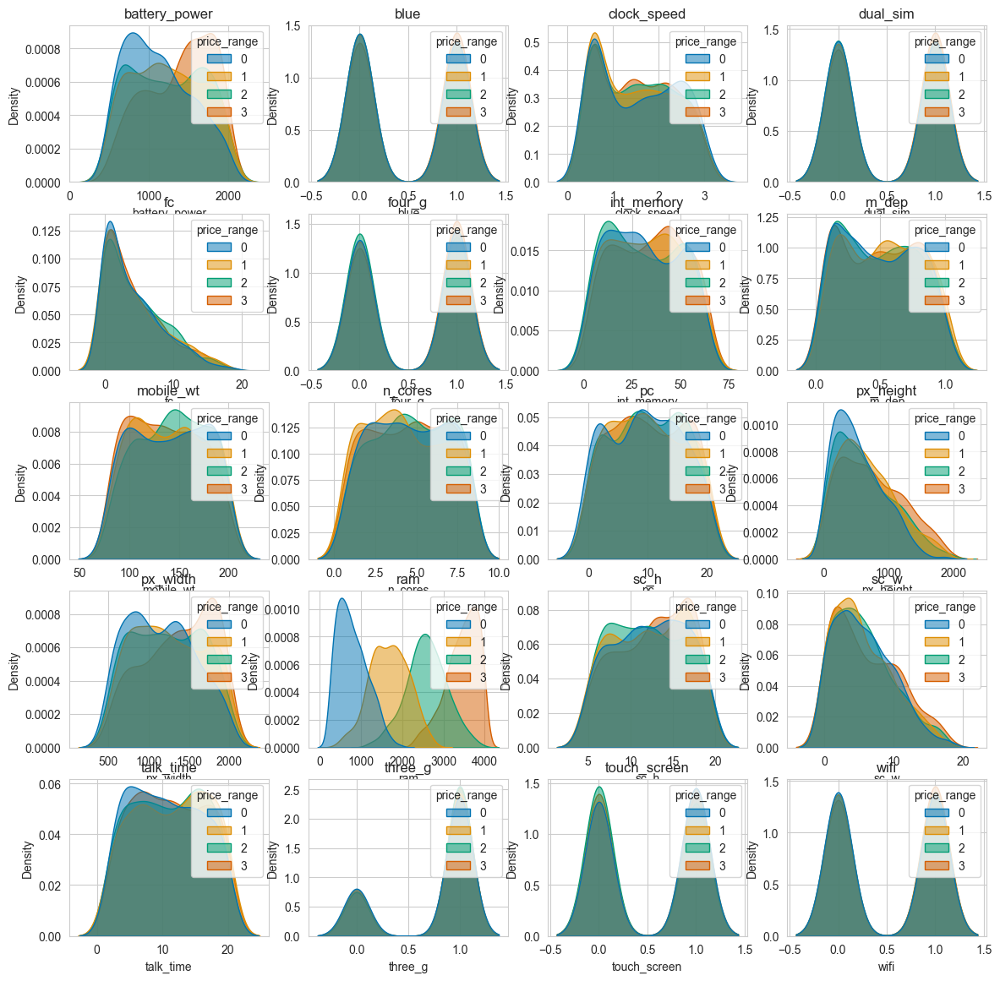

In [132]:
n_rows=5
n_cols=4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (14,14))
for k,col in enumerate(predictors_col):
    axes[k//n_cols, k%n_cols].set_title(col)
    sns.kdeplot(
                data=df_mobile,
                x=col,
                hue=target_variable,
                fill=True, 
                common_norm=False,
                palette="colorblind",
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )

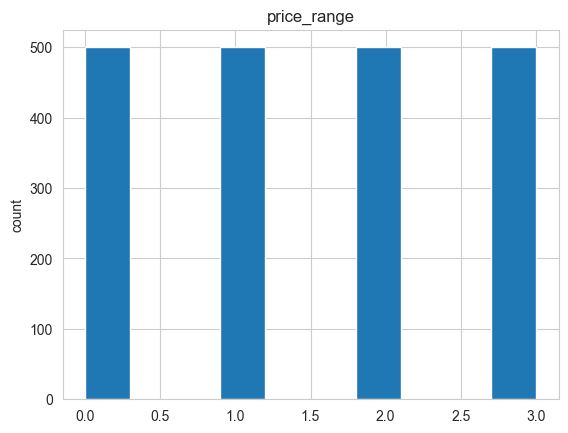

In [133]:
plt.hist(df_mobile.price_range)
plt.title("price_range")
plt.ylabel("count")
plt.show()

The classes are balanced 

This dataset is for multiclassifiaction tasks. However, so far we only did binary classification. As the classes have a meaning and their values are ordered, we can "make" two new classes according to the following mapping : 0 or 1 -> 0 and 2 or 3 -> 1 
This is not the best thing to do but it's a good proxy to test something 

In [134]:
df_mobile["price_range"] = np.where((df_mobile.price_range == 0) | (df_mobile.price_range == 1), 0, 1)

In [135]:
df_mobile.price_range

0       0
1       1
2       1
3       1
4       0
       ..
1995    0
1996    1
1997    1
1998    0
1999    1
Name: price_range, Length: 2000, dtype: int64

In [136]:
X = df_mobile[predictors_col]
y = df_mobile[target_variable]

<Axes: >

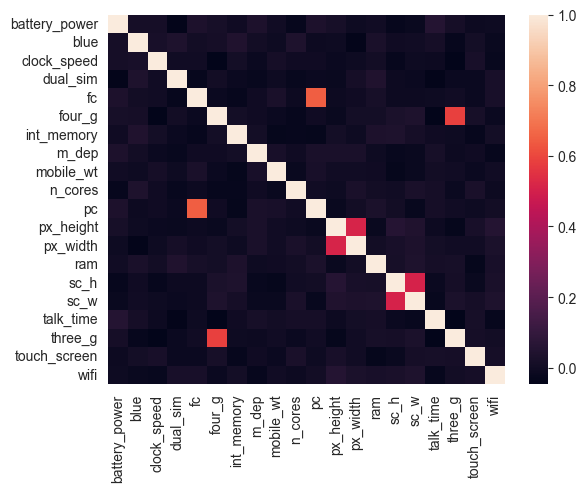

In [137]:
sns.heatmap(X.corr())

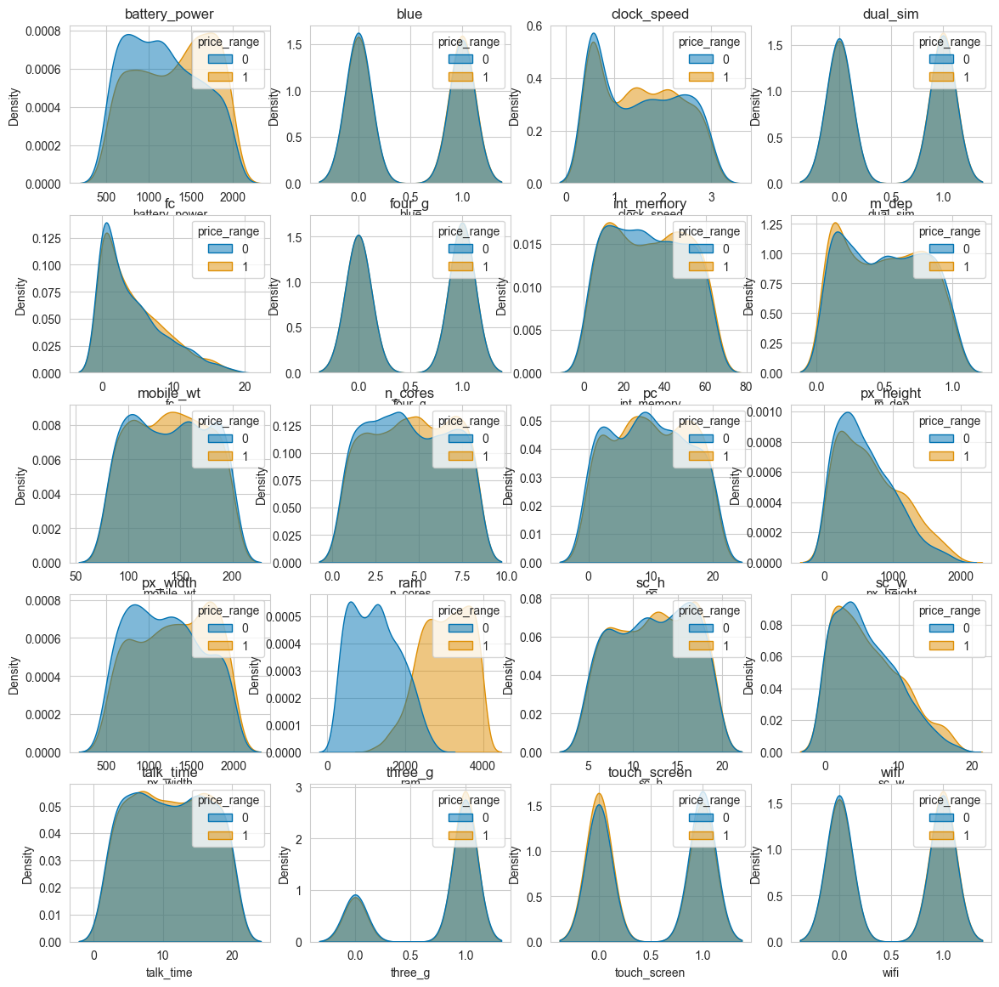

In [138]:
n_rows=5
n_cols=4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (14,14))
for k,col in enumerate(predictors_col):
    axes[k//n_cols, k%n_cols].set_title(col)
    sns.kdeplot(
                data=df_mobile,
                x=col,
                hue=target_variable,
                fill=True, 
                common_norm=False,
                palette="colorblind",
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )

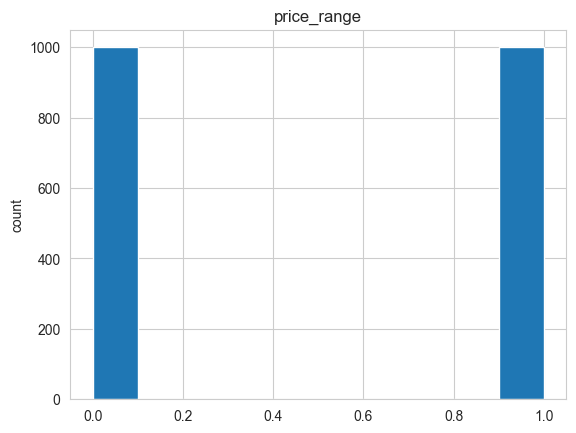

In [139]:
plt.hist(df_mobile.price_range)
plt.title("price_range")
plt.ylabel("count")
plt.show()

#### I.3.4.5) Trying models on the dataset

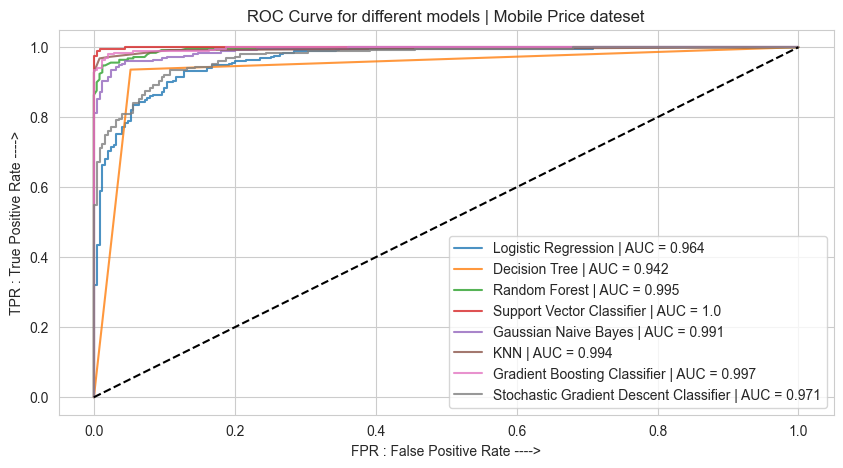

In [140]:
fig_roc_curve_mobile_price = make_roc_fig_classification(classifier_models,X,y, "Mobile Price")

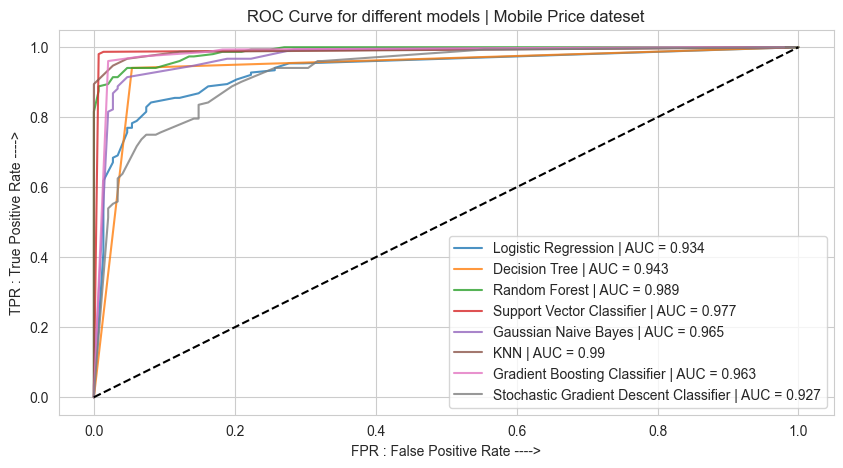

In [141]:
fig_roc_curve_mobile_price_v2 = make_roc_fig_classification_v2(classifier_models,X,y, "Mobile Price")

/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

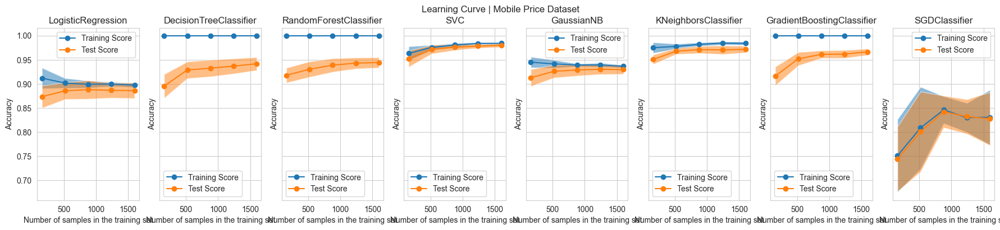

In [142]:
fig_learning_curve_mobile_price = make_learning_curve_fig(classifier_models,X,y, "Mobile Price")

### I.3.5 - The fifth classification dataset : mushroom classification

#### I.3.5.1) A first look at the dataset

In [143]:
df_mushroom = pd.read_csv("datasets/mushrooms/mushrooms.csv")

In [144]:
df_mushroom.head(10)

,class,cap-shape,cap-surface,cap-color,bruises,odor,gill-attachment,gill-spacing,gill-size,gill-color,...,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,...,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,...,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,...,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,...,s,w,w,p,w,o,e,n,a,g
5,e,x,y,y,t,a,f,c,b,n,...,s,w,w,p,w,o,p,k,n,g
6,e,b,s,w,t,a,f,c,b,g,...,s,w,w,p,w,o,p,k,n,m
7,e,b,y,w,t,l,f,c,b,n,...,s,w,w,p,w,o,p,n,s,m
8,p,x,y,w,t,p,f,c,n,p,...,s,w,w,p,w,o,p,k,v,g
9,e,b,s,y,t,a,f,c,b,g,...,s,w,w,p,w,o,p,k,s,m


In [145]:
print(f"The dataset has : \n -{df_mushroom.shape[0]} rows \n -{df_mushroom.shape[1]} columns")

The dataset has : 
 -8124 rows 
 -23 columns


In [146]:
print(df_mushroom.columns.tolist())

['class', 'cap-shape', 'cap-surface', 'cap-color', 'bruises', 'odor', 'gill-attachment', 'gill-spacing', 'gill-size', 'gill-color', 'stalk-shape', 'stalk-root', 'stalk-surface-above-ring', 'stalk-surface-below-ring', 'stalk-color-above-ring', 'stalk-color-below-ring', 'veil-type', 'veil-color', 'ring-number', 'ring-type', 'spore-print-color', 'population', 'habitat']


#### II.3.5.2) Missing values ?

In [147]:
(df_mushroom.isna().sum(axis = 0)/df_mushroom.shape[0] * 100).sort_values(ascending = False)

class                       0.0
stalk-surface-above-ring    0.0
population                  0.0
spore-print-color           0.0
ring-type                   0.0
ring-number                 0.0
veil-color                  0.0
veil-type                   0.0
stalk-color-below-ring      0.0
stalk-color-above-ring      0.0
stalk-surface-below-ring    0.0
stalk-root                  0.0
cap-shape                   0.0
stalk-shape                 0.0
gill-color                  0.0
gill-size                   0.0
gill-spacing                0.0
gill-attachment             0.0
odor                        0.0
bruises                     0.0
cap-color                   0.0
cap-surface                 0.0
habitat                     0.0
dtype: float64

no missing values

#### I.3.5.3) The different datatypes : predictors and target variable

In [148]:
df_mushroom.dtypes.value_counts()

object    23
Name: count, dtype: int64

In [149]:
df_mushroom["class"] = np.where(df_mushroom["class"] == "p", 0, 1)

Something interesting here is that every feature is categorical. Therefore to be sure that our model can understand it, the laziest thing we can do is one hot encode the variables

In [150]:
df_mushroom_one_hot = df_mushroom.copy(deep = True)
target_variable = "class"
categorical_variables = [col for col in df_mushroom.select_dtypes(["object"]) if col != target_variable]

encoder = OneHotEncoder(sparse_output=False)
one_hot_encoded = encoder.fit_transform(df_mushroom[categorical_variables])

one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(categorical_variables))

one_hot_df.reset_index(drop=True, inplace=True)
df_mushroom_one_hot.reset_index(drop=True, inplace=True)

df_mushroom_one_hot = pd.concat([df_mushroom_one_hot, one_hot_df], axis=1)
df_mushroom_one_hot.drop(categorical_variables, axis=1, inplace=True)

In [151]:
print(f"shape before one hot : {df_mushroom.shape}")
print(f"shape after one hot : {df_mushroom_one_hot.shape}")

shape before one hot : (8124, 23)
shape after one hot : (8124, 118)


In [152]:
df_mushroom_one_hot.head(10)

,class,cap-shape_b,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_f,cap-surface_g,cap-surface_s,...,population_s,population_v,population_y,habitat_d,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
6,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
7,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
8,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


#### I.3.5.4) Relationship between the predictors and the target variable

In [153]:
predictors_col = [col for col in df_mushroom_one_hot.columns.tolist() if col != target_variable]
X,y = df_mushroom_one_hot[predictors_col], df_mushroom_one_hot[target_variable]

In [154]:
X

,cap-shape_b,cap-shape_c,cap-shape_f,cap-shape_k,cap-shape_s,cap-shape_x,cap-surface_f,cap-surface_g,cap-surface_s,cap-surface_y,...,population_s,population_v,population_y,habitat_d,habitat_g,habitat_l,habitat_m,habitat_p,habitat_u,habitat_w
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8119,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8120,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8121,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
8122,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [155]:
y

0       0
1       1
2       1
3       0
4       1
       ..
8119    1
8120    1
8121    1
8122    0
8123    1
Name: class, Length: 8124, dtype: int64

<Axes: >

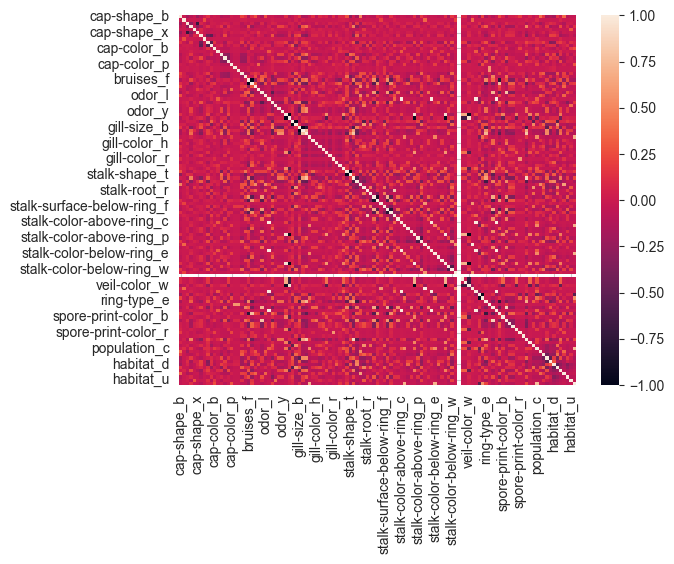

In [156]:
sns.heatmap(X.corr())

#### I.3.5.5) Trying models on the dataset

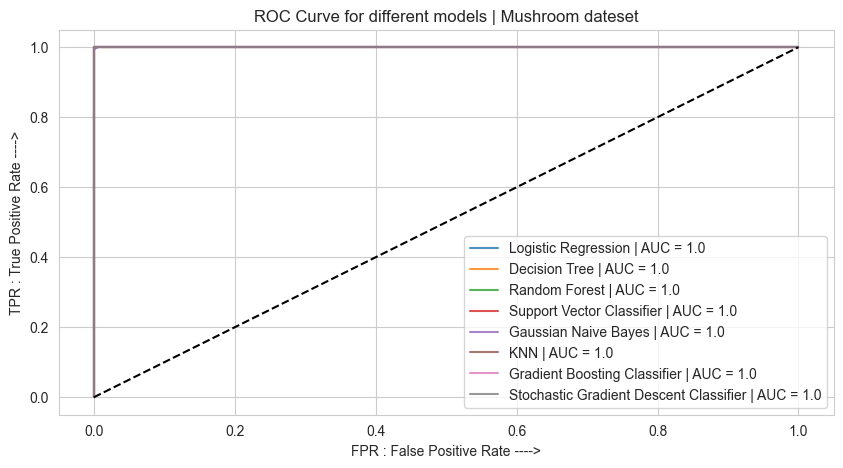

In [157]:
fig_roc_curve_mushroom = make_roc_fig_classification(classifier_models,X,y, "Mushroom")

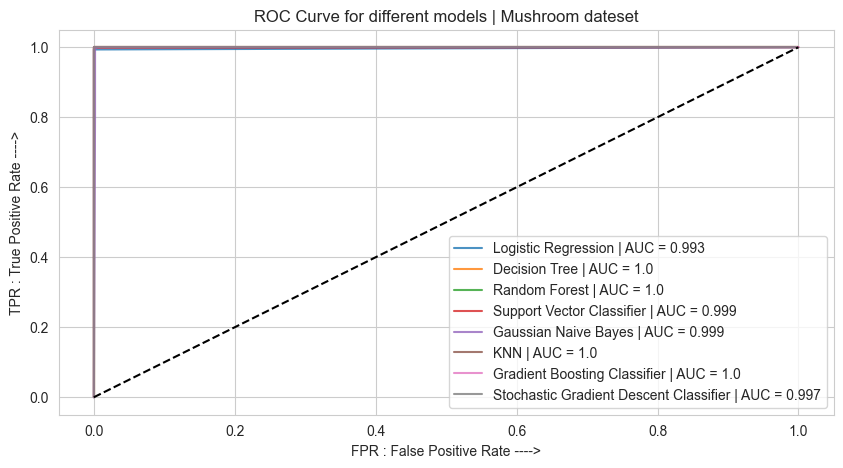

In [158]:
fig_roc_curve_mushroom_v2 = make_roc_fig_classification_v2(classifier_models,X,y, "Mushroom")

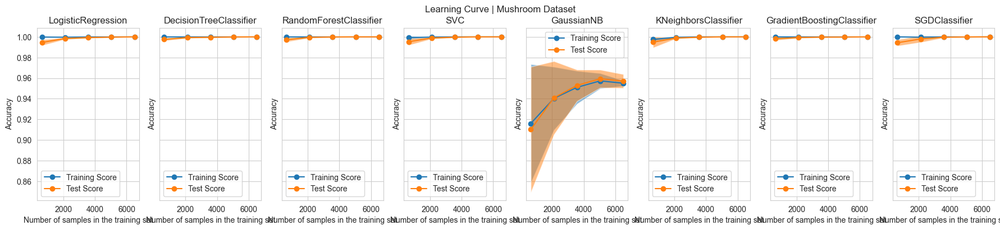

In [159]:
fig_learning_curve_mushroom = make_learning_curve_fig(classifier_models,X,y, "Mushroom")

### I.3.6 - The sixth classification dataset : elmy spot vs intraday prices

In [160]:
X = pd.read_csv("datasets/elmy_spot_vs_intraday/X_train.csv")
y = pd.read_csv("datasets/elmy_spot_vs_intraday/y_train.csv")

In [161]:
X.head()

,DELIVERY_START,load_forecast,coal_power_available,gas_power_available,nucelear_power_available,wind_power_forecasts_average,solar_power_forecasts_average,wind_power_forecasts_std,solar_power_forecasts_std,predicted_spot_price
0,2022-01-01 02:00:00+01:00,49439.0,3386.0,11487.0,44118.0,3035.0,0.0,79.248348,0.0,NaN
1,2022-01-01 03:00:00+01:00,46511.0,3386.0,11487.0,44118.0,3143.0,0.0,61.776532,0.0,NaN
2,2022-01-01 04:00:00+01:00,45158.0,3386.0,11487.0,44118.0,3288.0,0.0,44.291112,0.0,NaN
3,2022-01-01 05:00:00+01:00,44779.0,3386.0,11487.0,44118.0,3447.0,0.0,36.127588,0.0,NaN
4,2022-01-01 06:00:00+01:00,45284.0,3386.0,11487.0,44118.0,3679.0,0.0,30.983023,0.0,NaN


In [162]:
X.shape

(10605, 10)

In [163]:
y

,DELIVERY_START,spot_id_delta
0,2022-01-01 02:00:00+01:00,-36.874770
1,2022-01-01 03:00:00+01:00,-12.643588
2,2022-01-01 04:00:00+01:00,-1.950193
3,2022-01-01 05:00:00+01:00,1.938272
4,2022-01-01 06:00:00+01:00,0.199907
...,...,...
10600,2023-03-29 19:00:00+02:00,6.029303
10601,2023-03-29 20:00:00+02:00,13.576177
10602,2023-03-29 21:00:00+02:00,17.478945
10603,2023-03-29 22:00:00+02:00,17.559407


In [164]:
X.set_index("DELIVERY_START", inplace = True)
y.set_index("DELIVERY_START", inplace = True)

In [165]:
df_elmy = pd.concat([X,y], axis = 1)

In [166]:
df_elmy.head()

,load_forecast,coal_power_available,gas_power_available,nucelear_power_available,wind_power_forecasts_average,solar_power_forecasts_average,wind_power_forecasts_std,solar_power_forecasts_std,predicted_spot_price,spot_id_delta
DELIVERY_START,,,,,,,,,,
2022-01-01 02:00:00+01:00,49439.0,3386.0,11487.0,44118.0,3035.0,0.0,79.248348,0.0,NaN,-36.874770
2022-01-01 03:00:00+01:00,46511.0,3386.0,11487.0,44118.0,3143.0,0.0,61.776532,0.0,NaN,-12.643588
2022-01-01 04:00:00+01:00,45158.0,3386.0,11487.0,44118.0,3288.0,0.0,44.291112,0.0,NaN,-1.950193
2022-01-01 05:00:00+01:00,44779.0,3386.0,11487.0,44118.0,3447.0,0.0,36.127588,0.0,NaN,1.938272
2022-01-01 06:00:00+01:00,45284.0,3386.0,11487.0,44118.0,3679.0,0.0,30.983023,0.0,NaN,0.199907


In [167]:
print(f"The dataset has : \n -{df_elmy.shape[0]} rows \n -{df_elmy.shape[1]} columns")

The dataset has : 
 -10605 rows 
 -10 columns


In [168]:
(df_elmy.isna().sum(axis = 0)/df_elmy.shape[0] * 100).sort_values(ascending = False)

predicted_spot_price             82.593116
load_forecast                    12.135785
wind_power_forecasts_average      0.226308
solar_power_forecasts_average     0.226308
wind_power_forecasts_std          0.226308
solar_power_forecasts_std         0.226308
coal_power_available              0.009430
gas_power_available               0.009430
nucelear_power_available          0.009430
spot_id_delta                     0.000000
dtype: float64

In [169]:
print(f"before dropping rows : {df_elmy.shape[0]}")
print(f"after dropping rows : {df_elmy.dropna(axis = 0).shape[0]}")
print(f"The remaining percentage of rows is : {round(df_elmy.dropna(axis = 0).shape[0]/df_elmy.shape[0],3)}")

before dropping rows : 10605
after dropping rows : 1822
The remaining percentage of rows is : 0.172


In [170]:
df_elmy.dropna(inplace = True)

In [171]:
df_elmy["spot_id_delta_binary"] = np.where(df_elmy.spot_id_delta > 0, 1, 0)

<Axes: >

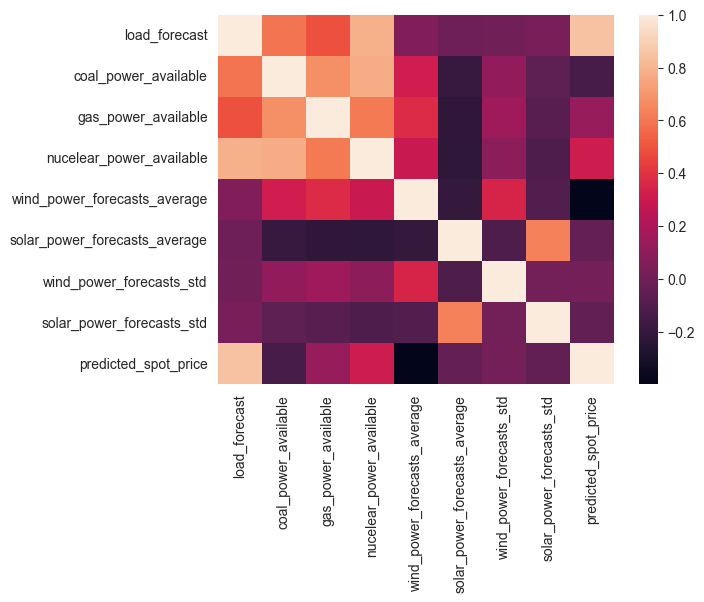

In [172]:
sns.heatmap(X.corr())

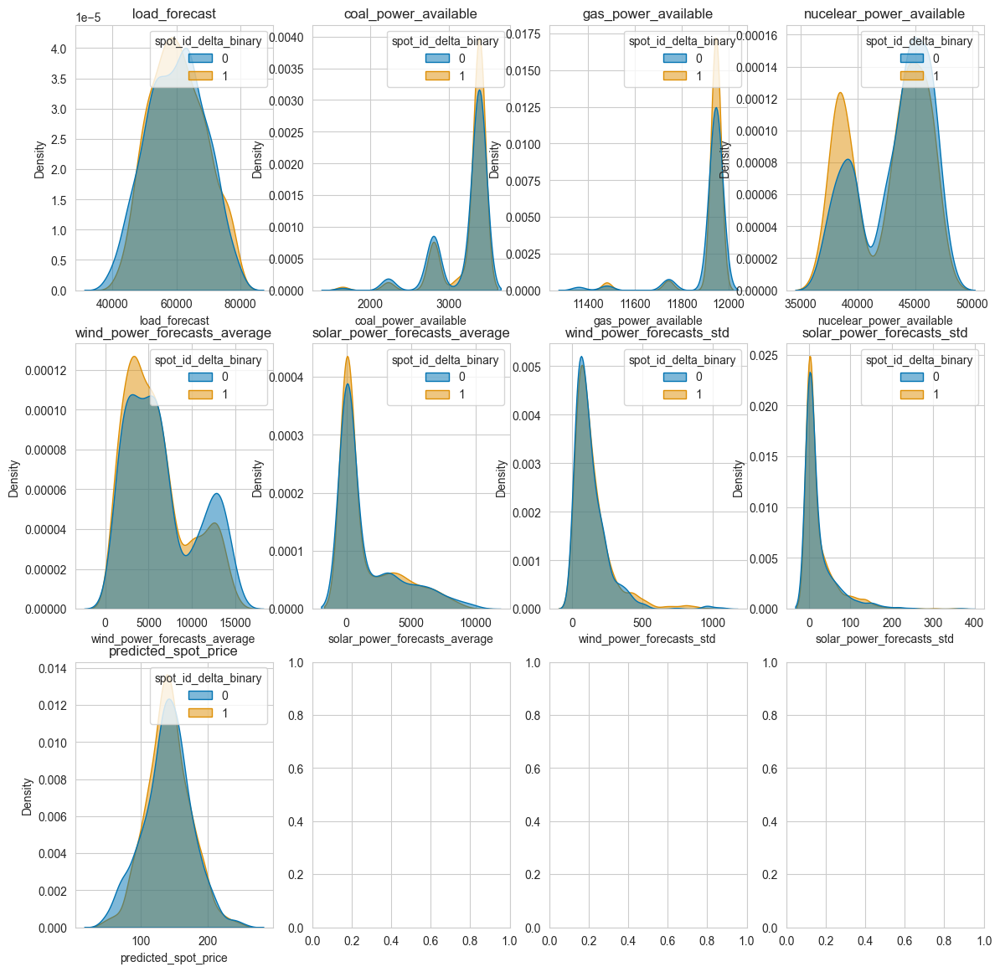

In [173]:
n_rows=3
n_cols=4
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize = (14,14))
for k,col in enumerate(X.columns.tolist()):
    axes[k//n_cols, k%n_cols].set_title(col)
    sns.kdeplot(
                data=df_elmy,
                x=col,
                hue="spot_id_delta_binary",
                fill=True, 
                common_norm=False,
                palette="colorblind",
                alpha=.5,
                linewidth=1,
                ax=axes[k//n_cols,k%n_cols]
    )

In [174]:
X_new = df_elmy[[col for col in df_elmy.columns.tolist() if col != "spot_id_delta_binary" and col != "spot_id_delta"]]
y_new = df_elmy["spot_id_delta_binary"]

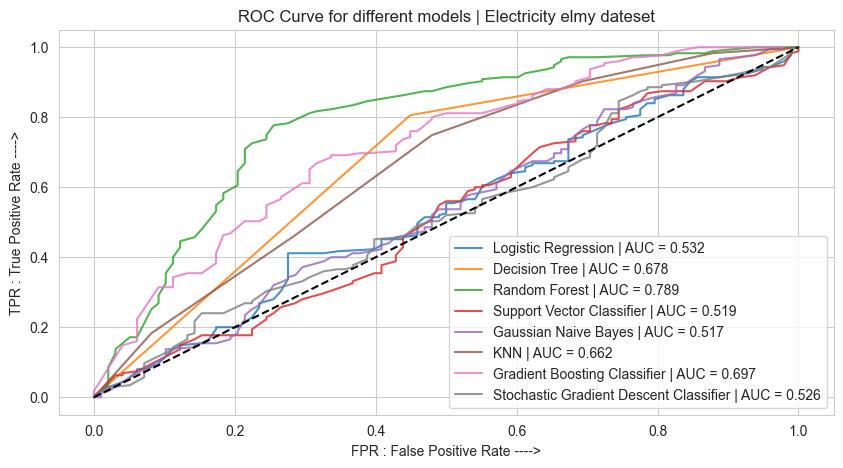

In [175]:
fig_roc_curve_elmy = make_roc_fig_classification_v2(classifier_models,X_new,y_new, "Electricity elmy")

/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

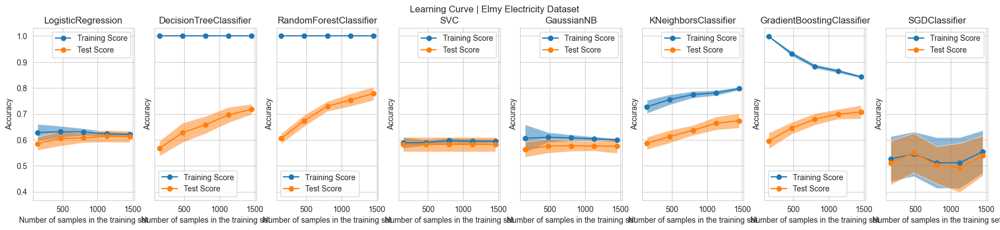

In [176]:
fig_learning_curve_elmy = make_learning_curve_fig(classifier_models,X_new,y_new, "Elmy Electricity")

### I.3.7 - The seventh classification dataset : madelon

In [177]:
path_madelon_train = "datasets/madelon/MADELON/madelon_train.data"
path_madelon_train_labels = "datasets/madelon/MADELON/madelon_train.labels"
path_madelon_test = "datasets/madelon/MADELON/madelon_test.data"
path_madelon_valid = "datasets/madelon/MADELON/madelon_valid.data"
path_madelon_valid_labels = "datasets/madelon/madelon_valid.labels"

In [178]:
df_madelon_train = pd.read_csv(path_madelon_train,delimiter=' ', header=None)
df_madelon_test = pd.read_csv(path_madelon_test,delimiter=' ', header=None)
df_madelon_train_labels = pd.read_csv(path_madelon_train_labels, delimiter=' ', header=None, names=['target'])

df_madelon = pd.concat([df_madelon_train, df_madelon_train_labels], axis = 1)

In [179]:
df_madelon.head(10)

,0,1,2,3,4,5,6,7,8,9,...,492,493,494,495,496,497,498,499,500,target
0,485,477,537,479,452,471,491,476,475,473,...,477,485,511,485,481,479,475,496,NaN,-1
1,483,458,460,487,587,475,526,479,485,469,...,487,338,513,486,483,492,510,517,NaN,-1
2,487,542,499,468,448,471,442,478,480,477,...,492,650,506,501,480,489,499,498,NaN,-1
3,480,491,510,485,495,472,417,474,502,476,...,474,572,454,469,475,482,494,461,NaN,1
4,484,502,528,489,466,481,402,478,487,468,...,452,435,486,508,481,504,495,511,NaN,1
5,481,496,451,480,516,484,484,476,500,482,...,477,435,491,564,482,463,457,500,NaN,1
6,484,533,498,466,577,482,471,477,476,468,...,490,648,484,475,479,475,462,484,NaN,1
7,474,468,598,490,530,482,448,476,497,489,...,511,351,462,533,480,501,529,489,NaN,-1
8,484,498,558,489,508,478,471,478,488,470,...,478,633,453,556,458,473,531,440,NaN,1
9,496,448,570,476,477,481,595,477,465,490,...,447,576,511,508,478,486,582,496,NaN,-1


In [180]:
print(f"The dataset has : \n -{df_madelon.shape[0]} rows \n -{df_madelon.shape[1]} columns")

The dataset has : 
 -2000 rows 
 -502 columns


In [181]:
(df_madelon.isna().sum(axis = 0)/df_madelon.shape[0] * 100).sort_values(ascending = False)

500       100.0
0           0.0
330         0.0
343         0.0
342         0.0
          ...  
162         0.0
161         0.0
160         0.0
159         0.0
target      0.0
Length: 502, dtype: float64

no missing value except the last column

In [182]:
df_madelon.dropna(axis = 1, inplace = True)

In [183]:
df_madelon

,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,target
0,485,477,537,479,452,471,491,476,475,473,...,481,477,485,511,485,481,479,475,496,-1
1,483,458,460,487,587,475,526,479,485,469,...,478,487,338,513,486,483,492,510,517,-1
2,487,542,499,468,448,471,442,478,480,477,...,481,492,650,506,501,480,489,499,498,-1
3,480,491,510,485,495,472,417,474,502,476,...,480,474,572,454,469,475,482,494,461,1
4,484,502,528,489,466,481,402,478,487,468,...,479,452,435,486,508,481,504,495,511,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,490,505,503,474,463,461,519,476,518,467,...,479,449,588,499,506,475,463,507,501,1
1996,480,475,476,480,495,482,515,479,480,484,...,474,473,424,454,570,476,493,465,485,-1
1997,480,517,631,470,485,474,535,476,493,466,...,483,479,687,488,488,483,500,523,481,-1
1998,484,481,505,478,542,477,518,477,510,472,...,483,526,750,486,529,484,473,527,485,1


<Axes: >

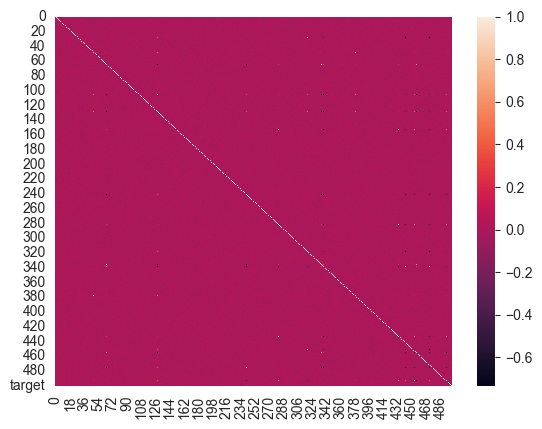

In [184]:
sns.heatmap(df_madelon.corr())

In [185]:
col_predictors = [col for col in df_madelon.columns.tolist() if col != "target"]
target_variable = "target"
X = df_madelon[col_predictors]
y = df_madelon[target_variable]

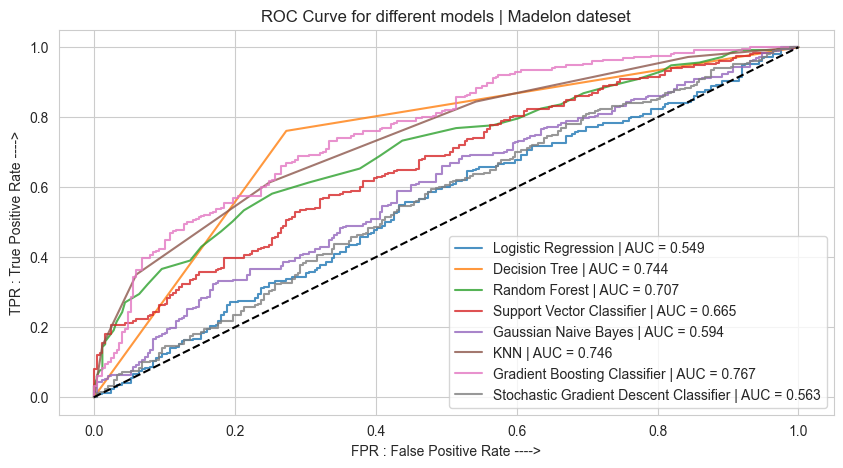

In [186]:
fig_roc_curve_madelon = make_roc_fig_classification(classifier_models, X,y, "Madelon")

/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/imadbda/PycharmProjects/MachineLearning_Zero_to_Hero/.venv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative sol

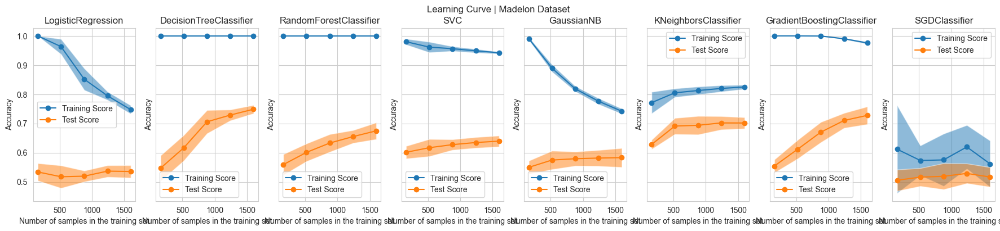

In [187]:
fig_learning_curve_madelon = make_learning_curve_fig(classifier_models,X,y, "Madelon")

# II - Unsupervised Learning

## II.1) Introduction and presentation of unsupervised learning